In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
import sklearn

In [2]:
np.random.seed(42)

plt.rcParams['figure.figsize'] = (12, 8)
sns.set_theme(style='whitegrid')

<h1 style="text-align: center">Ames House Price Prediction: EDA</h1>
<center><img style="height: 450px" src="https://livability.com/sites/default/files/151SUBAME031.jpg"></center>

<p style="text-align: center">
In this notebook, we will be exploring factores that impacted house sale price in Ames, Iowa. <br/>
The goal of this part is to make sense of provided dataset and turn these insights into actions during the second modeling part. <br/>
Along the way, we will try to dig into real estate domain logic as deep as we can explaining different relations between variables. We are doing this just for fun and it's not required to pass this competion well.
</p>

In [3]:
trainDf = train_df = pd.read_csv('data/train.csv')
testDf = test_df = pd.read_csv('data/test.csv')

fullDf = full_df = pd.concat([train_df, test_df], sort=True).reset_index(drop=True)

## Dataset Overview

Given training dataset has:
* a vast number of features (**80**)
* a small number of training examples (**2918**)

In [4]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   1stFlrSF       2919 non-null   int64  
 1   2ndFlrSF       2919 non-null   int64  
 2   3SsnPorch      2919 non-null   int64  
 3   Alley          198 non-null    object 
 4   BedroomAbvGr   2919 non-null   int64  
 5   BldgType       2919 non-null   object 
 6   BsmtCond       2837 non-null   object 
 7   BsmtExposure   2837 non-null   object 
 8   BsmtFinSF1     2918 non-null   float64
 9   BsmtFinSF2     2918 non-null   float64
 10  BsmtFinType1   2840 non-null   object 
 11  BsmtFinType2   2839 non-null   object 
 12  BsmtFullBath   2917 non-null   float64
 13  BsmtHalfBath   2917 non-null   float64
 14  BsmtQual       2838 non-null   object 
 15  BsmtUnfSF      2918 non-null   float64
 16  CentralAir     2919 non-null   object 
 17  Condition1     2919 non-null   object 
 18  Conditio

### Given Information
It's easy to get lost reviewing the list of available information. So we probably would like to group features somehow meaningfully.

* House Properties
    * Construction Date [YearBuilt]
    * Remodeling Date [YearRemodAdd]
    * Dwelling Class [BldgType] and Subclass [MSSubClass]
    * House Style [HouseStyle]
    * Area (sq. feets) [LotArea]
    * Shape [LotShape]
    * Flatness [LandContour] and slope [LandSlope]
    * Utilities (Gas, water, septic) [Utilities]
    * Overral Material and Finish Quality Rate [OverallQual]
    * Overral Condition Rate [OverallCond]
    * Living Area Above Ground [GrLivArea]
    * Total Rooms above grade (w/o bathrooms) [TotRmsAbvGrd]
    * Home Functionality [Functional]
    * ? [LotConfig]
* House Access
    * Road Access [Street] [LotFrontage]
    * Alley Access [Alley]
    * House Road Connection [LotFrontage]
* House Location
    * Neighborhood (Physical Location) [Neighborhood]
    * Zoning classification [MSZoning]
    * Location Conditions (1 or 2) [Condition1][Condition2]
* Roof Properties
    * Roof Style [RoofStyle]
    * Roof Material [RoofMatl]
* Exterior
    * Exterior Covering (1 or 2 materials) [Exterior1st] [Exterior2nd]
    * Exterior Material Quality [ExterQual]
    * Exterior Material Condition [ExterCond]
* Masonry veneer
    * Masonry Veneer Type [MasVnrType]
    * Masonry Veneer Area [MasVnrArea]
* Basement
    * Foundation Type (stone, wood, etc) [Foundation]
    * Basement Quality [BsmtQual]
    * Basement Condition [BsmtCond]
    * Basement Exposure [BsmtExposure]
    * Basement finished area rating (1 or 2) [BsmtFinType1][BsmtFinType2]
    * Basement Finished area (1 or 2) [BsmtFinSF1] [BsmtFinSF2]
    * Basement Unfinished Area [BsmtUnfSF]
    * Total Basement Area [TotalBsmtSF]
* Heating
    * Heating Type [Heating]
    * Heating Quality and Condition Rate [HeatingQC]
* Air Condition
    * Is Central Air Condition? [CentralAir]
* Electrical System Type [Electrical]
* Floors
    * First Floor Area [1stFlrSF]
    * Second Floor Area [2ndFlrSF]
* ? [LowQualFinSF]
* Bathroom
    * Basement Full Bathroom [BsmtFullBath]
    * Basement Half Bathroom [BsmtHalfBath]
    * Full bathroom above grade [FullBath]
    * Half bathroom above grade [HalfBath]
* Bedroom
    * Bedroom above grade (w/o basement bedrooms) [BedroomAbvGr]
* Kitchen
    * Kitchen Above Grade [KitchenAbvGr]
    * Kitchen Quality [KitchenQual]
* Fireplaces
    * Number of fireplaces [Fireplaces]
    * Fireplace Quality [FireplaceQu]
* Garage
    * Garage Type [GarageType]
    * Year Garage was built [GarageYrBlt]
    * Interior Finish of the garage [GarageFinish]
    * Garage Size (in cars) [GarageCars]
    * Garage Area [GarageArea]
    * Garage Quality [GarageQual]
    * Garage Condition [GarageCond]
* Paved driveway (paved, dirt, etc) [PavedDrive]
* Porch
    * Wood Deck Area [WoodDeckSF]
    * Open Porch Area (in sq ft) [OpenPorchSF]
    * Enclosed Porch Area [EnclosedPorch]
    * 3 seasons porch area [3SsnPorch]
    * Screen Porch area [ScreenPorch]
* Pool
    * Pool area [PoolArea]
    * Pool Quality [PoolQC]
* Miscellaneous Features (elevator, 2nd garage, etc) [MiscFeature]
    * Miscellaneous Features Value in $ [MiscVal]
* Fence [Fence]
* Sale Information
    * Month Sold [MM]
    * Year Sold [YYYY]
    * Sale Type (Warranty Deed, new, etc) [SaleType]
    * Sale Condition (family sale, normal sale, etc) [SaleCondition]

With this number of features, we would like to quickly separate them into two groups by type: numerical and categorical features. This may be handy further during data exploration.

In [6]:
for dataframe in [train_df, test_df, full_df]:
    dataframe['MSSubClass'] = dataframe['MSSubClass'].apply(str)
    dataframe['YrSold'] = dataframe['YrSold'].astype(str)
    dataframe['MoSold'] = dataframe['MoSold'].astype(str)

In [7]:
num_features = [f for f in full_df.columns if full_df.dtypes[f] != 'object']
num_features.remove('Id')
num_features.remove('SalePrice')

cat_features = [f for f in full_df.columns if full_df.dtypes[f] == 'object']

## Missing Information

Let's check missing information in our dataset.

In [8]:
missing_df = full_df.isnull().sum()
missing_df = missing_df.drop(missing_df[missing_df == 0].index).sort_values(ascending=False)
missing_df.drop(['SalePrice'], inplace=True)

missing_df = pd.DataFrame({'missing_count': missing_df})
missing_df['missing_rate'] = (missing_df['missing_count'] / len(full_df)) * 100

Text(0.5, 1.0, 'Missing Data per Feature')

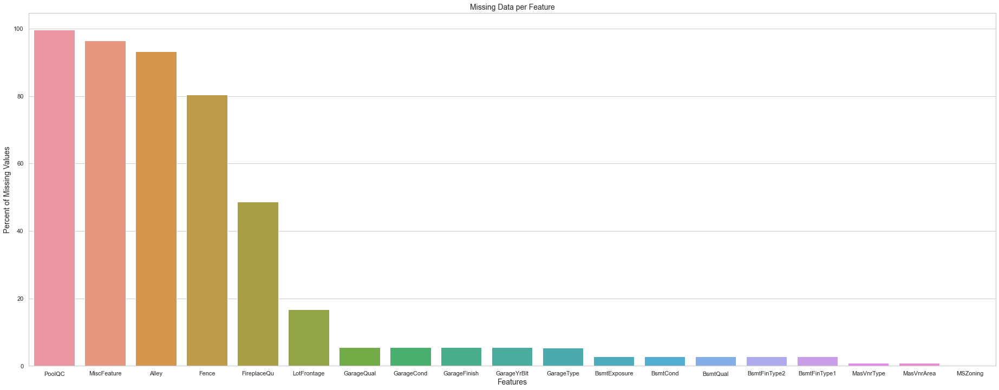

In [9]:
top_five_missing_df = missing_df[missing_df['missing_count'] > 3]

plt.figure(figsize=(32, 12))
sns.barplot(x=top_five_missing_df.index, y='missing_rate', data=top_five_missing_df)
plt.xlabel('Features', fontsize=14)
plt.ylabel('Percent of Missing Values', fontsize=14)
plt.title('Missing Data per Feature', fontsize=14)

In [10]:
missing_df

,missing_count,missing_rate
PoolQC,2909,99.657417
MiscFeature,2814,96.402878
Alley,2721,93.216855
Fence,2348,80.438506
FireplaceQu,1420,48.646797
LotFrontage,486,16.649538
GarageQual,159,5.447071
GarageCond,159,5.447071
GarageFinish,159,5.447071
GarageYrBlt,159,5.447071


There are **34** features that are affected by missing values. Let's review them:
* **FireplaceQu**, **Garage{X}**, **Alley**, **PoolQC**, **Bsmt{X}**, **MasVnr{X}**, **Fence** - we can assume that these features are not applicable to all samples that why they are missing. It's easy to imagine houses that don't have pools, basements or fireplaces.
* **MiscFeature** is also an optional feature that indicates additional benefits of the lot. It impacts the house sale price by **MiscVal** amount.
* **MSSubClass** - it's hard to assume about house sub class. It could be eigher missing value or untypical house building style. Let's stick with the first assumption
* **MSZoning**, **SaleType**, **Electrical**, **Utilities**, **Exterior{X}**, **KitchenQual** - we can assume these labels are missing
* **Functional** - dataset description suggests to assume missing information as typical

We may impute missing features by some constant value that indicates that feature is not part of a lot:

In [11]:
for feature in (
    'PoolQC', 
    'FireplaceQu', 
    'Alley', 
    'Fence', 
    'MiscFeature', 
    'BsmtQual', 
    'BsmtCond', 
    'BsmtExposure', 
    'BsmtFinType1', 
    'BsmtFinType2',
    'GarageType', 
    'GarageFinish', 
    'GarageQual', 
    'GarageCond',
    'BsmtQual', 
    'BsmtCond', 
    'BsmtExposure', 
    'BsmtFinType1', 
    'BsmtFinType2',
    'MasVnrType',
    'MSSubClass',
):
    train_df[feature] = train_df[feature].fillna('None')
    full_df[feature] = full_df[feature].fillna('None')

In [12]:
for feature in (
    'BsmtFinSF1', 
    'BsmtFinSF2', 
    'BsmtUnfSF',
    'TotalBsmtSF', 
    'BsmtFullBath', 
    'BsmtHalfBath',
    'MasVnrArea',
    'GarageCars',
    'GarageArea',
    'GarageYrBlt',
):
    train_df[feature] = train_df[feature].fillna(0)
    full_df[feature] = full_df[feature].fillna(0)

Features that we assumed missing, they can be impute by the most common values:

In [13]:
for feature in (
    'Electrical', 
    'KitchenQual', 
    'Exterior1st',
    'Exterior2nd', 
    'SaleType',
    'MSZoning',
    'Utilities',
):
    train_df[feature] = train_df[feature].fillna(train_df[feature].mode()[0])
    full_df[feature] = full_df[feature].fillna(full_df[feature].mode()[0])

In [14]:
train_df['Functional'] = train_df['Functional'].fillna('Typ')
full_df['Functional'] = full_df['Functional'].fillna('Typ')

In [15]:
ordinal_cat_mapping = {
    'ExterQual': {'Po': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4}, 
    'ExterCond': {'Po': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4},
    'BsmtQual': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'BsmtCond': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'BsmtFinType1': {'None': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
    'BsmtFinType2': {'None': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
    'HeatingQC': {'Po': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4},
    'KitchenQual': {'Po': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4},
    'FireplaceQu': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'GarageFinish': {'None': 0, 'Unf': 1, 'RFn': 2, 'Fin': 3},
    'GarageQual': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'GarageCond': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'PoolQC': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'Fence': {'None': 0, 'MnWw': 1, 'GdWo': 2, 'MnPrv': 3, 'GdPrv': 4},
    'PavedDrive': {'N': 0, 'P': 1, 'Y': 2},
    'CentralAir': {'N': 0, 'Y': 1},
    'Alley': {'None': 0, 'Pave': 1, 'Grvl': 2},
    'Street': {'Pave': 0, 'Grvl': 1},
}

In [16]:
from sklearn.preprocessing import LabelEncoder

non_ordinal_cat_features = list(set(cat_features) - set(ordinal_cat_mapping.keys()))

enc_cat_features = []

for cat_feature in non_ordinal_cat_features:
    train_df[cat_feature + 'Enc'] = LabelEncoder().fit_transform(train_df[cat_feature])
    full_df[cat_feature + 'Enc'] = LabelEncoder().fit_transform(full_df[cat_feature])
    enc_cat_features.append(cat_feature + 'Enc')

for ordinal_feature, feature_mapping in ordinal_cat_mapping.items():
    full_df[ordinal_feature + 'Enc'] = full_df[ordinal_feature].map(feature_mapping)
    train_df[ordinal_feature + 'Enc'] = train_df[ordinal_feature].map(feature_mapping)

**LotFrontage** has ~17% of missing information. This feature may be helpful, so let's try to fill it. 

First, we need to understand what information we can use to impute **LotFrontage** (other words, what other features correlate with **LotFrontage**):

<AxesSubplot:xlabel='corralation', ylabel='feature'>

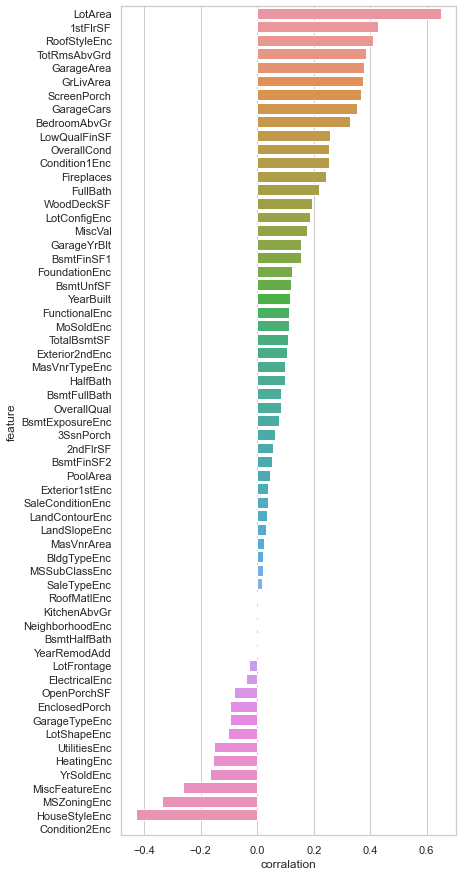

In [17]:
features = num_features + enc_cat_features + ['SalePrice']
features.remove('LotFrontage')

frontage_corr_df = pd.DataFrame()
frontage_corr_df['feature'] = num_features + enc_cat_features
frontage_corr_df['corralation'] = [train_df[feature].corr(train_df['LotFrontage'], 'spearman') for feature in features]
frontage_corr_df.sort_values('corralation', ascending=[0], inplace=True)

plt.figure(figsize=(6, 0.25 * len(features)))
sns.barplot(data=frontage_corr_df, y='feature', x='corralation', orient='h')

We can see that frontage depends on the general lot area and floor areas, house type and style, location itself, location conditions and land configurations. Also, features like garage, pool or porch can give us an idea how width frontage could be. 

So now let's train a regression model that will fill frontage for us:

In [72]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.model_selection import cross_validate

def create_frontage_regressor():
    # params were found by SearchGridCV
    return RandomForestRegressor(
        max_depth=15,
        max_features=5,
        min_samples_leaf=2,
        min_samples_split=9,
        n_estimators=1100,
        random_state=42
    )

frontage_features = [
    'LotArea', 
    '1stFlrSF',
    '2ndFlrSF',
    'BldgTypeEnc',
    'MSSubClass', 
    'HouseStyleEnc',
    'NeighborhoodEnc',
    'GarageArea', 
    'AlleyEnc', 
    'LotConfigEnc', 
    'MSZoningEnc',
    'LotShapeEnc',
    'PoolArea',
    'LandContourEnc',
    'OpenPorchSF',
    'SaleConditionEnc',
    'Condition1Enc',
    'Condition2Enc',
]

frontage_train_df = full_df[full_df['LotFrontage'].notnull()]
frontage_features_df = frontage_train_df[frontage_features]
frontage_target_df = frontage_train_df['LotFrontage']

# measure model performance on the training and validation sets
rf_frontage_regressor = create_frontage_regressor()

scores = cross_validate(
        rf_frontage_regressor, frontage_features_df, frontage_target_df, 
        scoring=['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error'], cv=2,
        n_jobs=-1, verbose=0
)


mse_score = -1 * scores['test_neg_mean_squared_error'].mean()
mse_std = scores['test_neg_mean_squared_error'].std()

mae_score = -1 * scores['test_neg_mean_absolute_error'].mean()
mae_std = scores['test_neg_mean_absolute_error'].std()

r2_score_mean = scores['test_r2'].mean()
r2_std = scores['test_r2'].std()

print('[CV] MSE: %.4f (%.4f)' % (mse_score, mse_std))
print('[CV] MAE: %.4f (%.4f)' % (mae_score, mae_std))
print('[CV] R^2: %.4f (%.4f)' % (r2_score_mean, r2_std))

# final train on whole dataset
rf_frontage_regressor = create_frontage_regressor()
rf_frontage_regressor.fit(frontage_features_df, frontage_target_df);

[CV] MSE: 159.8933 (21.2866)
[CV] MAE: 7.3194 (0.1168)
[CV] R^2: 0.6704 (0.0319)


On average, our frontage regressor is wrong on about 7.32 $ft^2$ (~0.74 $m^2$). I don't believe that simpler assumption like imputing mean value for Neighborhood-HouseClass would work more precise. We can be very unfortunate to fill frontages for houses from groups with significant deviation (e.g. 15-20 $ft^2$ (1.4-1.9 $m^2$)):

In [19]:
frontage_train_df[['NeighborhoodEnc', 'MSSubClass', 'LotFrontage']].groupby(['NeighborhoodEnc', 'MSSubClass']).describe()

LotFrontage                                    \
                                 count       mean        std   min   25%   
NeighborhoodEnc MSSubClass                                                 
0               120               17.0  46.411765   4.783550  43.0  43.0   
                20                 3.0  49.666667   5.773503  43.0  48.0   
1               120                3.0  35.000000   0.000000  35.0  35.0   
                160                7.0  24.000000   0.000000  24.0  24.0   
2               160               30.0  21.500000   1.137147  21.0  21.0   
...                                ...        ...        ...   ...   ...   
23              60                11.0  81.000000  15.824032  42.0  77.5   
                80                 5.0  85.800000  22.521101  73.0  73.0   
24              120                5.0  34.400000  10.430724  22.0  30.0   
                20                 8.0  90.000000  13.596218  68.0  80.0   
                80                 3.0  86.666667  11.547005  80.0  80.0   

                                               
                             50%   75%    max  
NeighborhoodEnc MSSubClass                     
0               120         43.0  53.0   53.0  
                20          53.0  53.0   53.0  
1               120         35.0  35.0   35.0  
                160         24.0  24.0   24.0  
2               160         21.0  21.0   24.0  
...                          ...   ...    ...  
23              60          83.0  86.5  107.0  
                80          73.0  85.0  125.0  
24              120         32.0  38.0   50.0  
                20          92.0  97.0  110.0  
                80          80.0  90.0  100.0  

[156 rows x 8 columns]

Finally, let's impute **LotFrontage** feature:

In [20]:
train_df.loc[train_df['LotFrontage'].isnull(), 'LotFrontage'] = rf_frontage_regressor.predict(
    train_df[train_df['LotFrontage'].isnull()][frontage_features]
)

full_df.loc[full_df['LotFrontage'].isnull(), 'LotFrontage'] = rf_frontage_regressor.predict(
    full_df[full_df['LotFrontage'].isnull()][frontage_features]
)

## Typos in Values

In [21]:
for dataframe in [train_df, test_df, full_df]:
    dataframe['Exterior1st'].replace(['Brk Cmn', 'CmentBd', 'Wd Shng'], ['BrkComm', 'CemntBd', 'Wd Sdng'], inplace=True)
    dataframe['Exterior2nd'].replace(['Brk Cmn', 'CmentBd', 'Wd Shng'], ['BrkComm', 'CemntBd', 'Wd Sdng'], inplace=True)

## House Properties and SalePrice Relations

### 1.2.1 Sale Price Distribution

First things goes first. Let's see SalePrice distribution shape:

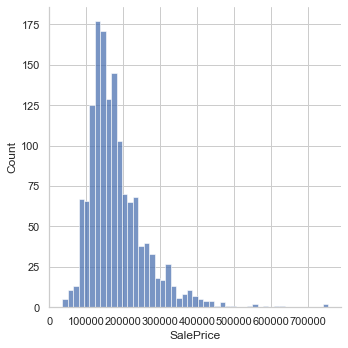

In [22]:
sns.displot(full_df['SalePrice'])

In [23]:
print('Skewness: %f' % train_df['SalePrice'].skew())
print('Kurtosis: %f' % train_df['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


SalePrice distribution resembles a normal distribution that skewed to the right.

We may want to **apply log scaling** to normalize the SalePrice shape, because ML algorithms performs better on the normally distributed features.

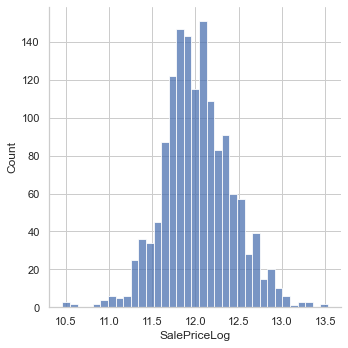

In [24]:
full_df['SalePriceLog'] = np.log(full_df['SalePrice'])

sns.displot(full_df['SalePriceLog'])

What about SalePrice central tendency?

In [25]:
fullDf['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

The `75%` of houses have price `$214k` and less. 25%, 50% and 75% may define a price tiers for us to simplify understand of the catgorical data. With this in mind, let's add a new column `SalePriceGroup` with three tiers:
* Cheap Groups:
    * `Less than 25%` houses (<= $129k)
    * Houses from `25% - 50%` range (>\$129k and <=\$163k)
* Expensive Groups:
    * Houses from `50%-75%` range (>\$163k and <=\$214k)
    * `75% and more` 

In [26]:
def imputeSalePriceGroup(salePrice):
    if salePrice <= 129975:
        return '25% and less'
    if salePrice > 129975 and salePrice <= 163000:
        return '25% - 50%'
    if salePrice > 163000 and salePrice < 214000:
        return '50% - 75%'
    if salePrice >= 214000:
        return '75% and more'

full_df['SalePriceGroup'] = full_df['SalePrice'].apply(imputeSalePriceGroup)

It's useful to see a correlations between numerical features before we take a deeper look at each feature:

### 1.3.2 Room Number, Lot and Living Areas, Floor Areas

Let's check Living area distribution:

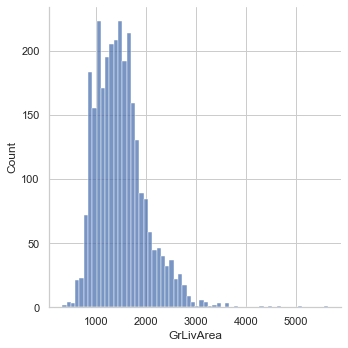

In [27]:
sns.displot(data=full_df['GrLivArea'])

**Living area** is skewed. We may want to log transform it like **SalePrice**:

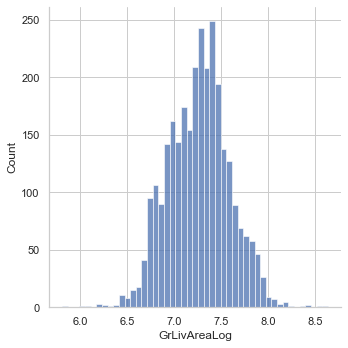

In [28]:
full_df['GrLivAreaLog'] = np.log(full_df['GrLivArea'])

sns.displot(data=full_df['GrLivAreaLog'])

**Living Area** supposes to impact **SalePrice** and this is what we see on the next plot:

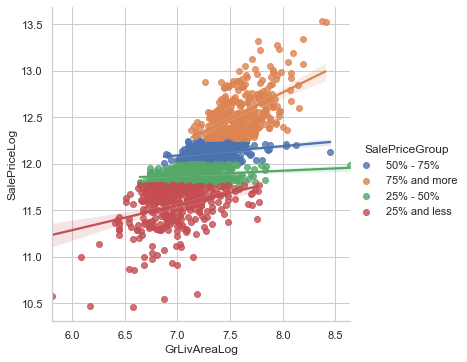

In [29]:
sns.lmplot(data=full_df, x='GrLivAreaLog', y='SalePriceLog', hue='SalePriceGroup')

We see a linear correlation and raising the SalePrice as the living area goes up/right.

There are two outliers. Their area more than 4,000 $ft^2$ but the sale prices are below than an average. Let's remove them from the dataset:

In [30]:
full_df.drop(
    full_df[(full_df['GrLivArea'] > 4000) & (full_df['SalePrice'] < 700000)].index,
    inplace=True
)

Next feature is **Total Room Number**. 

**Total Room Number** is connected to **Living Area** (correlation - `0.81`). The more living area, the more rooms normally present.

Room number seems to correlate with SalePrice as well (correlation - `0.54`).

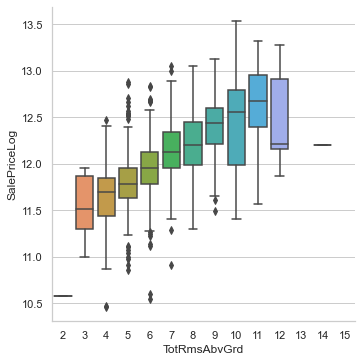

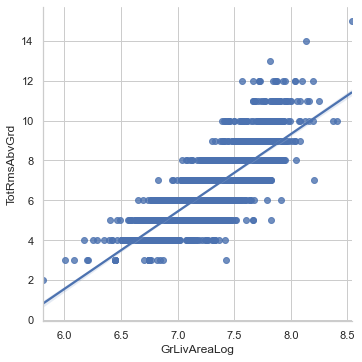

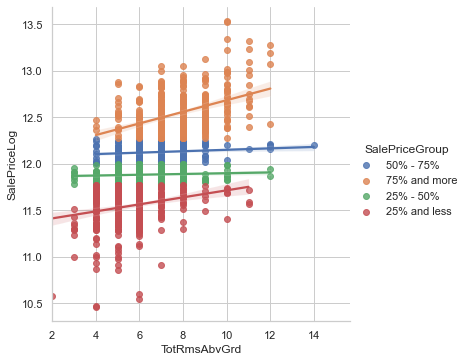

In [73]:
sns.catplot(data=full_df, x='TotRmsAbvGrd', y='SalePriceLog', kind='box')
sns.lmplot(data=full_df, x='GrLivAreaLog', y='TotRmsAbvGrd')
sns.lmplot(data=full_df, x='TotRmsAbvGrd', y='SalePriceLog', hue='SalePriceGroup')

Most of the **lot areas** are **less than 50000 $ft^2$**. Probably, there might be some building standards that keep lot areas inside of the range.

That's why Lot Area just slightly correlates with SalPrice (correlation - `0.21`). It also one of the skewed features:

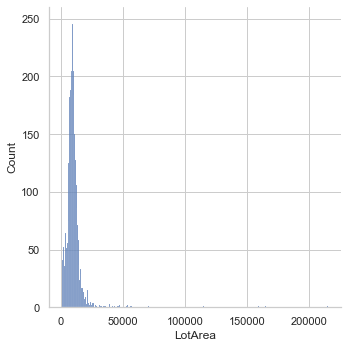

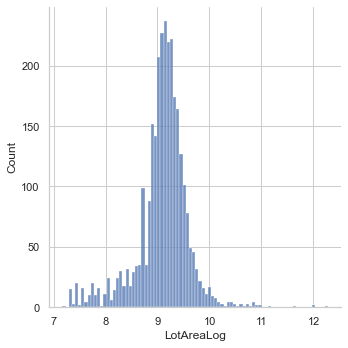

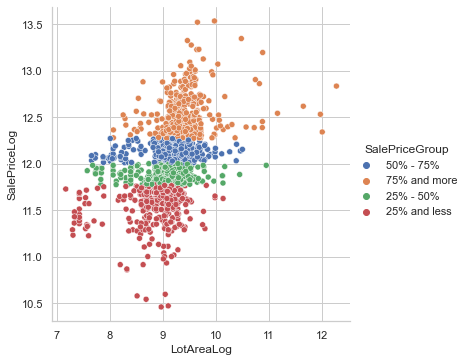

In [32]:
full_df['LotAreaLog'] = np.log(full_df['LotArea'])

sns.displot(data=full_df['LotArea'])
sns.displot(data=full_df['LotAreaLog'])
sns.relplot(data=full_df, x='LotAreaLog', y='SalePriceLog', hue='SalePriceGroup')

Part of the houses have more than 1 floor:

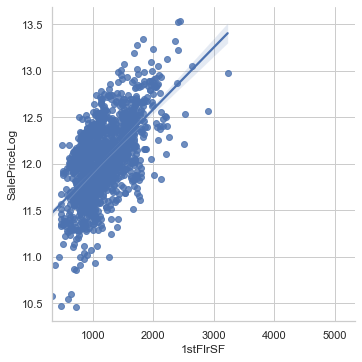

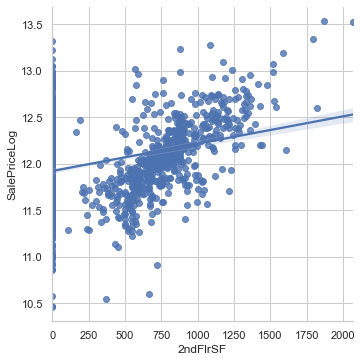

In [151]:
sns.lmplot(data=full_df, x='1stFlrSF', y='SalePriceLog')
sns.lmplot(data=full_df, x='2ndFlrSF', y='SalePriceLog')

**Floor areas** correlates with **SalePrice**. Namely, **SalePrice** seems to be linearly dependent on 1st floor area (and slightly on the 2nd floor area).

If we **summ 1st and 2nd floar areas**, we will get the **living area** feature.

### 1.3.4 House Types and Styles

<img src="https://st.hzcdn.com/simgs/pictures/exteriors/exterior-knight-construction-design-inc-img~333123010ec2c3ca_4-3527-1-e24d363.jpg" width="600px" />

Dataset contains three features related to **house building style**:

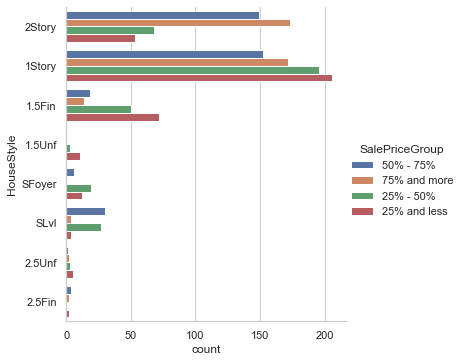

In [32]:
# House Styles correlate with sale prices
# House prices > 75% perc: 2Story, 1Story 1.5Fin
# House prices > 50% and > 75% perc: 2Story, 1Story, SLvl, 2.5Fin
# House prices < 25% and > 50% perc: 1Story, 2Story, 1.5Fin, SLvl, 2.5Unf, 1.5Unf
# House prices < 25% perc: 1.5Fin, 1.5Unf, 2.5Unf

sns.catplot(data=full_df, y='HouseStyle', hue='SalePriceGroup', kind='count')

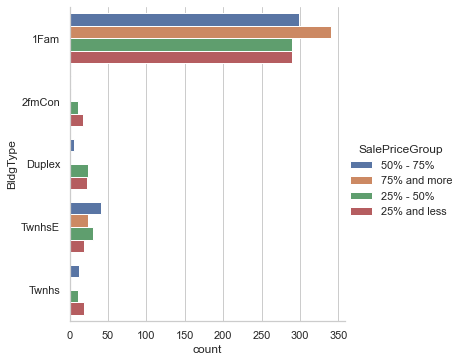

In [33]:
# Dwelling Type correlates house sale price
## House prices > 75% perc: 1Fam, TwnhsE
## House prices > 50% and < 75% perc: 1Fam, TwnhsE, TwnhsI
## House prices > 25% and < 50% perc: 1Fam, 2FamCon, TwnhsE, TwnhsI, Duplex
## House prices < 25% perc: 1Fam, 2fmCon, TwnhsE, TwnhsI, Duplex

sns.catplot(data=full_df, y='BldgType', hue='SalePriceGroup', kind='count')

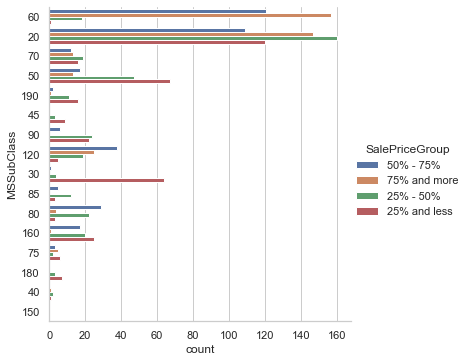

In [34]:
# MSSubClass type of dwelling is a helpful differentiator of the sale price
## House prices > 75% perc: 20, 60, 70, 75, 80, 120 (1 and 2 story of 1946 and newer)
## House prices > 50% and < 75% perc: 20, 60, 80, 120, 160 (diff styles of newer types)
## House prices > 25% and < 50% perc: 20, 30, 40, 45, 50, 60, 70, 80, 85, 90, 120, 160, 190
## House prices < 25% perc: 20, 30, 45, 50, 70, 75, 90, 120, 160, 190 (Older and unfinished styles)

sns.catplot(data=full_df, y='MSSubClass', hue='SalePriceGroup', kind='count')

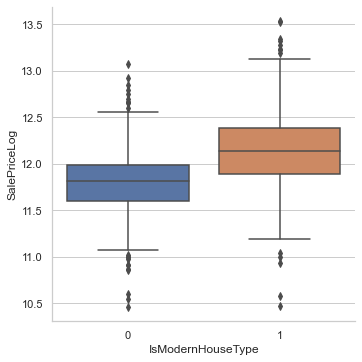

In [58]:
full_df['IsModernHouseType'] = full_df['MSSubClass'].map({
    '20': 1, 
    '30': 0, 
    '40': 0, 
    '45': 0, 
    '50': 0, 
    '60': 1, 
    '70': 0, 
    '75': 0,
    '80': 0, 
    '85': 0, 
    '90': 0, 
    '120': 1, 
    '150': 0, 
    '160': 0, 
    '180': 0, 
    '190': 0,
})

sns.catplot(data=full_df, x='IsModernHouseType', y='SalePriceLog', kind='box')

### LotShape and LotConfig

<img src="https://www.thespruce.com/thmb/3SxFiTuF_AkddfCepVSTOVUJSIU=/1989x1492/smart/filters:no_upscale()/fotog-56a2e3333df78cf7727af480.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='LotConfig'>

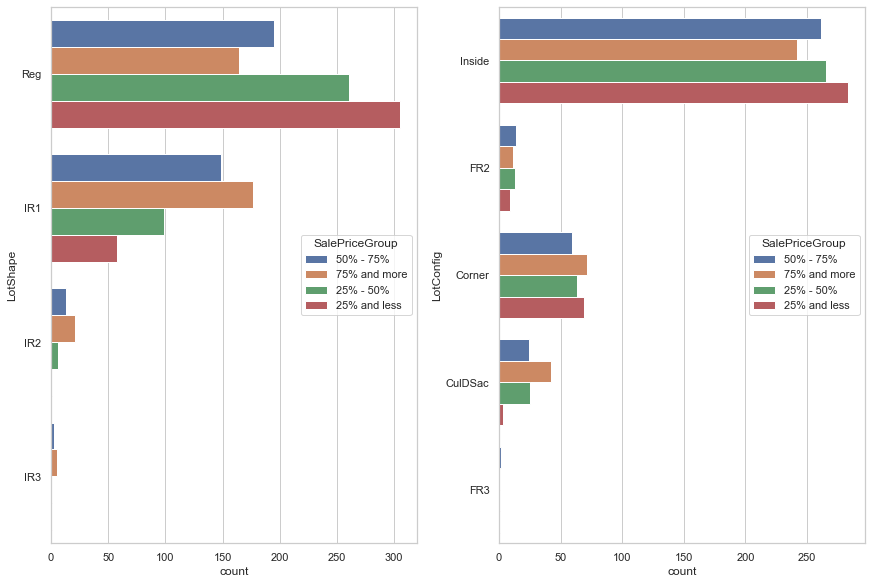

In [35]:
# Houses with SalePrice > 75% percentile dominate among houses with irregular shape.
# Most of the Houses with SalePrice < 25% have a regular shape tho.

# Lot configuration: 
## Houses with SalePrice > 75% percentile have Corner, Inside, FR2, CulDSac types
## Houses with SalePrice < 25% have mostly inside types and also Corner and FR2 types
# More info: https://www.thetruthaboutrealty.com/real-estate-lot-types/

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='LotShape', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='LotConfig', hue='SalePriceGroup', ax=ax[1])

<img src="https://i.pinimg.com/originals/73/42/79/7342799b300e2a8a6493426909d6beaa.jpg" />

**Frontage** is width of a lot, measured at the front part of the lot. **Footage** correlates with **LotArea** (the bigger lot area, the bigger frontage). **Frontage** is also a skewed feature:

More Info: https://www.gimme-shelter.com/frontage-50043/

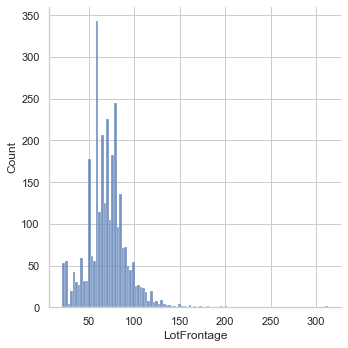

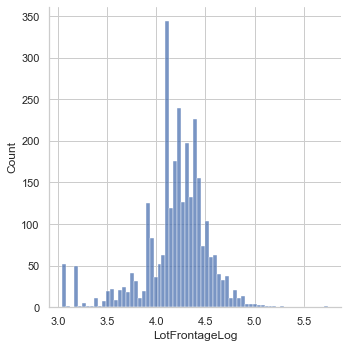

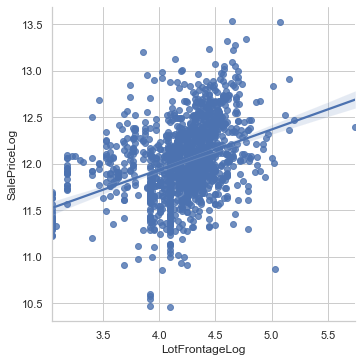

In [154]:
full_df['LotFrontageLog'] = np.log(full_df['LotFrontage'])

sns.displot(full_df['LotFrontage'])
sns.displot(full_df['LotFrontageLog'])
sns.lmplot(data=full_df, x='LotFrontageLog', y='SalePriceLog')

**SalePrice** seems to be linearly dependent on the **Frontage**. 
Wider houses are more valuable than "deep" one. A wider lot will allow for a larger house, and often allow for more space between homes or buildings. Wide lots also allow decent parking on front streets or duplexes to be built on the lot as long as the zoning permits it

### LandContour and LandSlope

<img src="https://res.cloudinary.com/trends-publishing/image/upload/ar_1.8,c_thumb,dpr_2.0,g_center,w_800/f_auto,q_auto:best/0152817.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='LandSlope'>

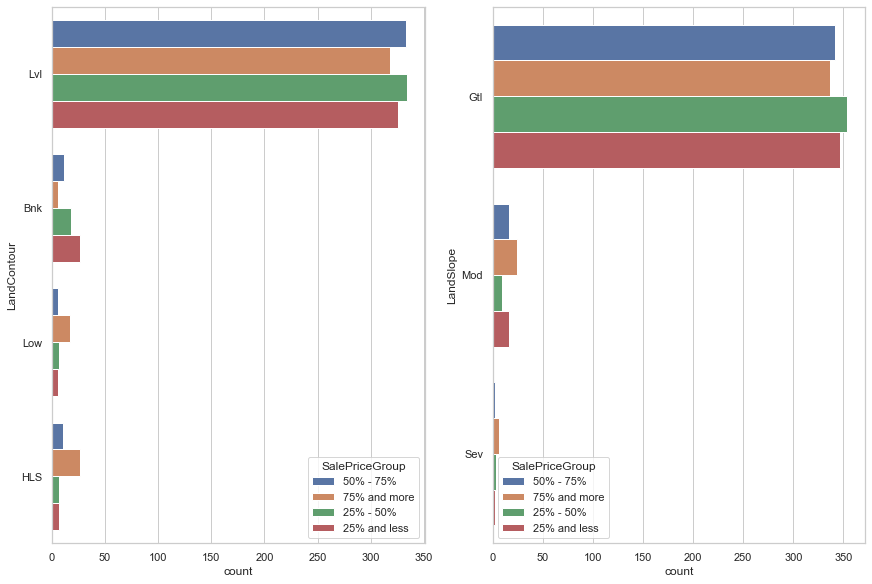

In [38]:
# Land Contour
## Low and hillside flatness as well as moderate and severe slopes dominate among house with SalePrice > 75% percentile. Probably, these houses have some kind of landscape design work done

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='LandContour', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='LandSlope', hue='SalePriceGroup', ax=ax[1])

### Foundation and Basement

<img src="https://i.pinimg.com/736x/d2/41/da/d241da589a358ca41be75dbacb968815.jpg" />

**Basement** is part of house that located below the ground. 

When it's finished, basement can be pretty helpfull. There may be located a bathroom or cozy corner for the rest 

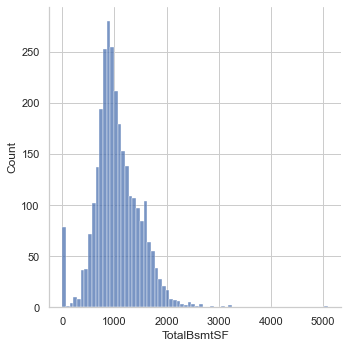

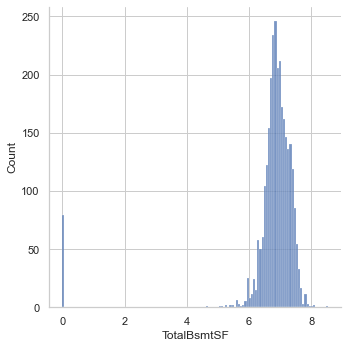

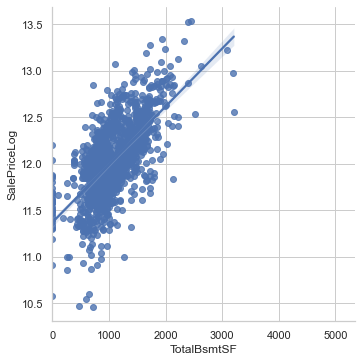

In [155]:
sns.displot(full_df['TotalBsmtSF'])
sns.displot(np.log1p(full_df['TotalBsmtSF']))
sns.lmplot(data=full_df, x='TotalBsmtSF', y='SalePriceLog')

While basement area is not that attractive as above ground one, it still strongly correlates with SalePrice.

Basement Quality and Condition should help us to calibrate a part of SalePrice that the basement brings:

<AxesSubplot:xlabel='count', ylabel='BsmtCond'>

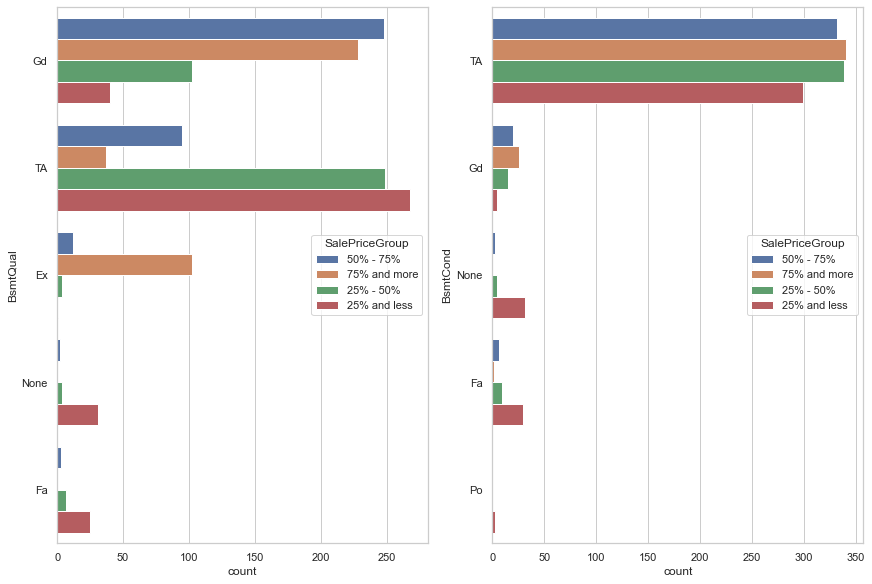

In [40]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='BsmtQual', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='BsmtCond', hue='SalePriceGroup', ax=ax[1])

Basement Quality and Condition show a typical situation: >50% tier has basements with above average conditions and built from quality materials.


Another metric is whenever basement is finished or not:

<AxesSubplot:xlabel='count', ylabel='BsmtFinType2'>

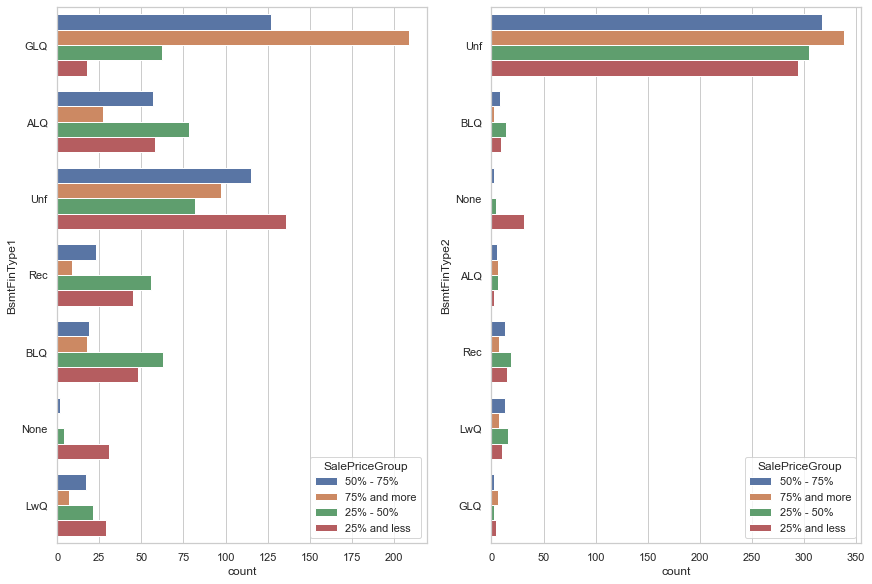

In [41]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="BsmtFinType1", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="BsmtFinType2", hue="SalePriceGroup", ax=ax[1])

Basement may be finished in different ways. It can be turned into recreation, living quarters or bathrooms:

More Info: https://www.cidbasements.com/qualifies-finished-basement#:~:text=A%20basement%20is%20finished%20when,level%20ceilings%2C%20and%20finished%20walls.

Big part of houses don't have bathrooms in the basement. Half bathrooms in the basement is rare and some houses actully have full bathrooms in the basement.

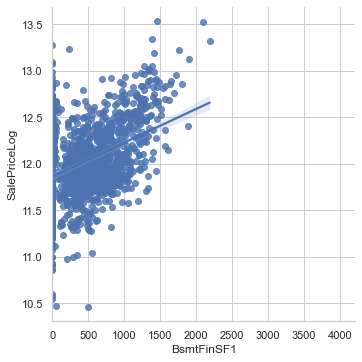

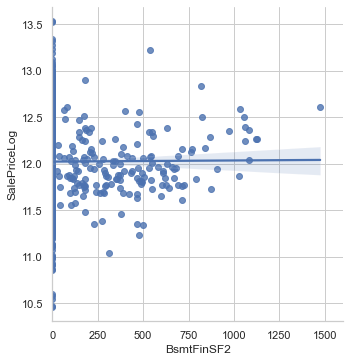

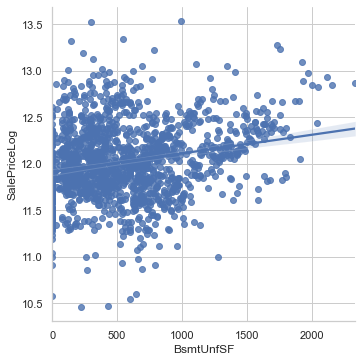

In [156]:
sns.lmplot(data=full_df, x='BsmtFinSF1', y='SalePriceLog')
sns.lmplot(data=full_df, x='BsmtFinSF2', y='SalePriceLog')
sns.lmplot(data=full_df, x='BsmtUnfSF',  y='SalePriceLog')

Essentially, **TotalBsmtSF** is a sum of **BsmtFinSF1**, **BsmtFinSF2** and **BsmtUnfSF**. 

All missing information in these fields we can impute with zeroes. Most likely, missing information in basement areas mean that a lot doesn't have basement.

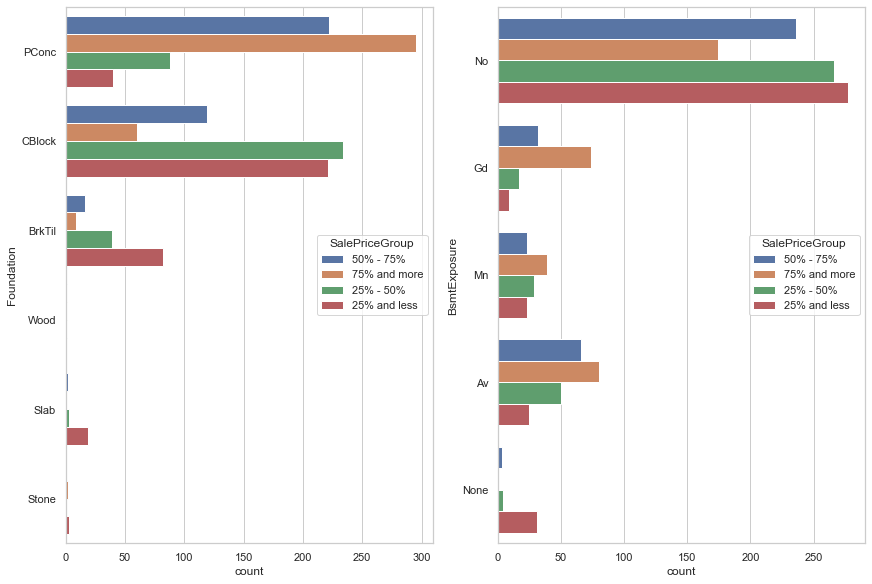

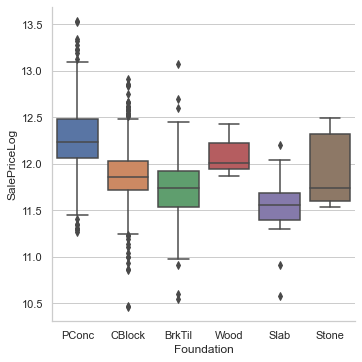

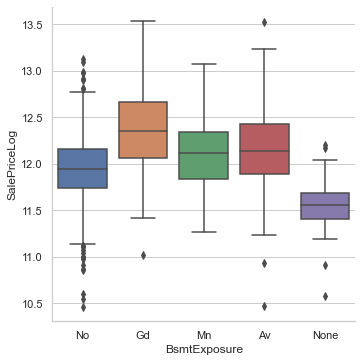

In [75]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='Foundation', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='BsmtExposure', hue='SalePriceGroup', ax=ax[1])

sns.catplot(data=full_df, x='Foundation', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='BsmtExposure', y='SalePriceLog', kind='box')

Poured Contrete foundation is popular in >50% tier. It seems to be a modern way to found houses. The rest of types may be just old fashion.

### House Overall Condition and Material Quality

<AxesSubplot:xlabel='count', ylabel='OverallQual'>

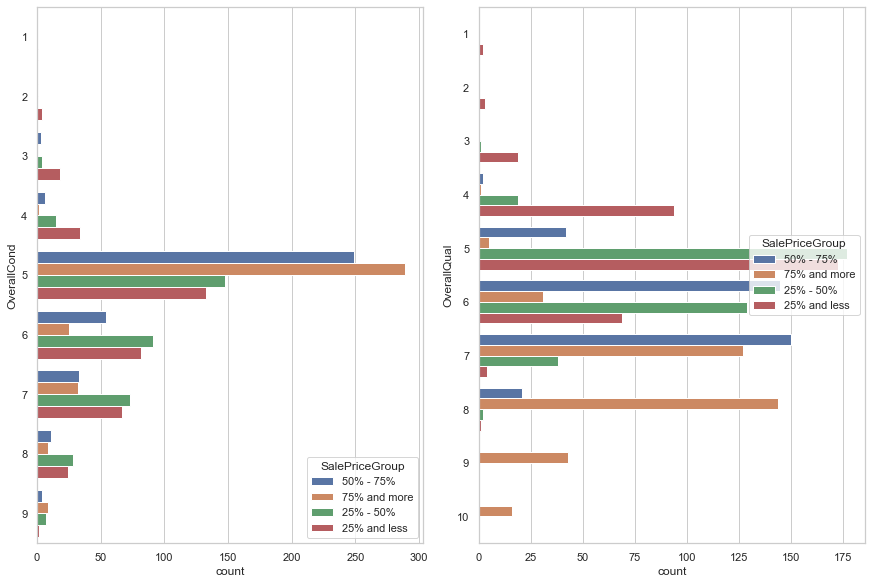

In [45]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='OverallCond', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='OverallQual', hue='SalePriceGroup', ax=ax[1])

**Overall Condition** and **Overall Material Quality** strongly correlates with SalePrices.

Houses with SalePrice > 50% percentile have **average and higher overall** condition. Lots with SalePrice < 50% tier have a higher percentage among **below average condition** houses, but generally they are included to all condition groups.

**Overall Material Quality** seems to differentiate expensive houses from cheap ones. Lots with SalePrice < 50% tier dominates in average and below quality groups. In above average quality groups, there are a bigger percentage of houses with SalePrice > 50% tier (particularly, lots with SalePrice > 75% tier prevail in "very good" and above quality groups).

Let's try to create **Overall House QC** metric:

<AxesSubplot:xlabel='count', ylabel='OverallHouseQC'>

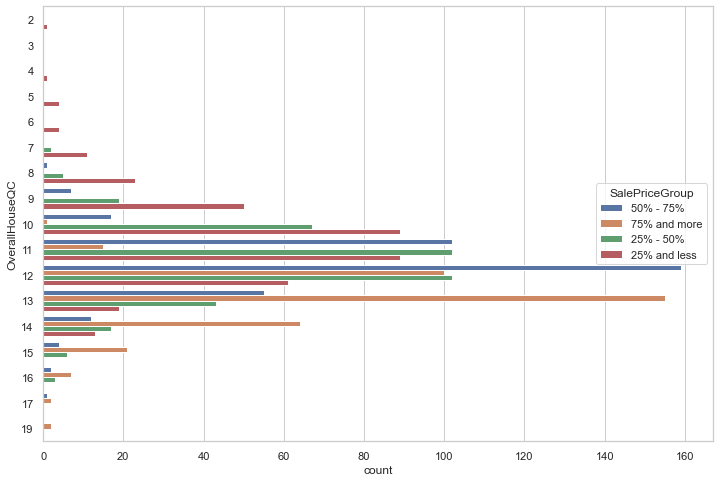

In [121]:
full_df['OverallHouseQC'] = full_df['OverallCond'] + full_df['OverallQual']

sns.countplot(data=full_df, y='OverallHouseQC', hue='SalePriceGroup')

Also, let's try to bin this metrics as we get a lot of categories:

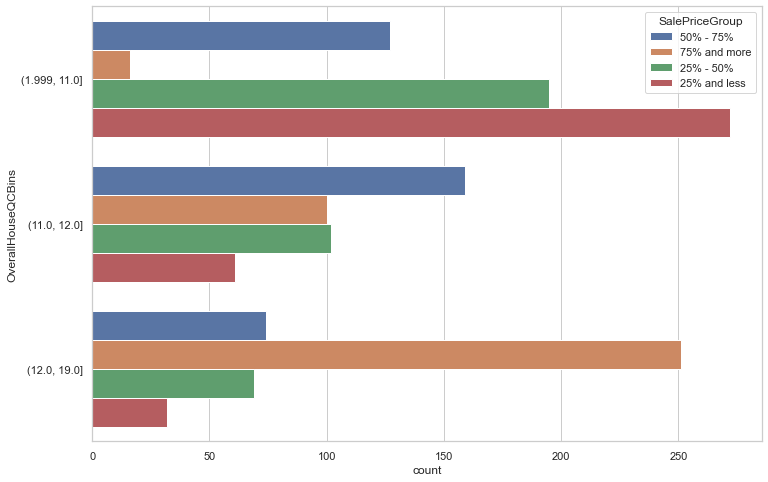

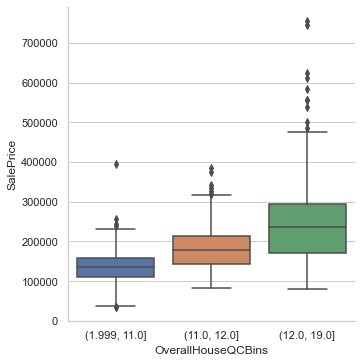

In [139]:
full_df['OverallHouseQCBins'] = pd.qcut(full_df['OverallHouseQC'], q=3)

sns.countplot(data=full_df, y='OverallHouseQCBins', hue='SalePriceGroup')
sns.catplot(data=full_df, x='OverallHouseQCBins', y='SalePrice', kind='box')

Three bins diffentiate houses well from what we can see on the boxplot.

<AxesSubplot:xlabel='count', ylabel='Functional'>

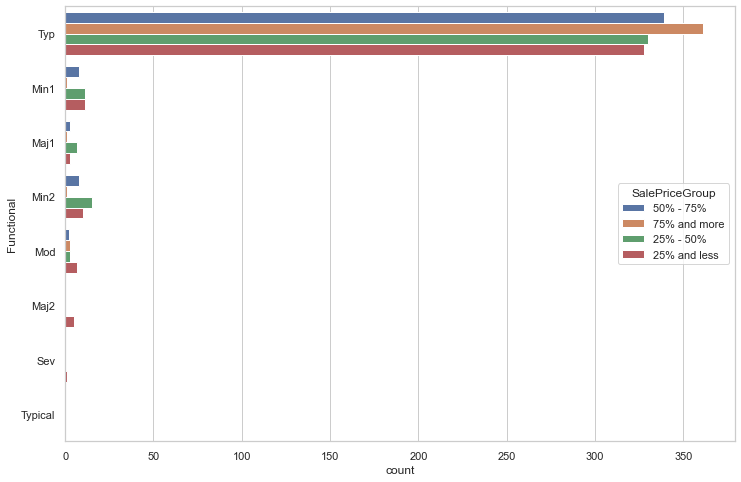

In [46]:
sns.countplot(data=full_df, y='Functional', hue='SalePriceGroup')

Samples with a functionality other than "Typical" **losses sale prices drastically**. 

Other types of functionality are much less frequent. So we may benefit from turing **Functional** feature into flag or reduce number of groups:

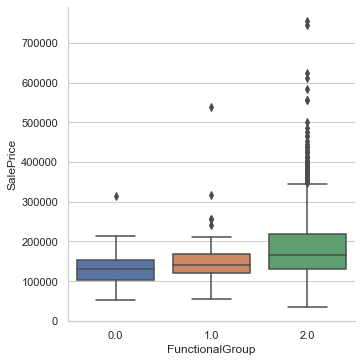

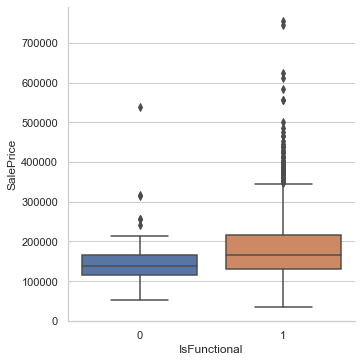

In [117]:
full_df['IsFunctional'] = (full_df['Functional'] == 'Typ') * 1
full_df['FunctionalGroup'] = full_df['Functional'].map({
    'Typ': 2,
    'Min1': 1,
    'Min2': 1,
    'Mod': 1,
    'Maj1': 0,
    'Maj2': 0,
    'Sev': 0,
    'Sav': 0,
})

sns.catplot(data=full_df, x='FunctionalGroup', y='SalePrice', kind='box')
sns.catplot(data=full_df, x='IsFunctional', y='SalePrice', kind='box')

### Year Built and Renovate

Let's see how old houses and when they were remodeled:

In [93]:
full_df[['YearBuilt', 'YearRemodAdd']].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
YearBuilt,2917.0,1971.287967,30.286991,1872.0,1953.0,1973.0,2001.0,2010.0
YearRemodAdd,2917.0,1984.248200,20.892257,1950.0,1965.0,1993.0,2004.0,2010.0


The dataset covers houses that were build between 1872 and 2010 (138 years). It's 10-years old as of now (2020) which is okay for training purpose, but will be not that useful for production.

How did **YearBuild** affect **SalePrice**?

<AxesSubplot:xlabel='YearBuilt', ylabel='Count'>

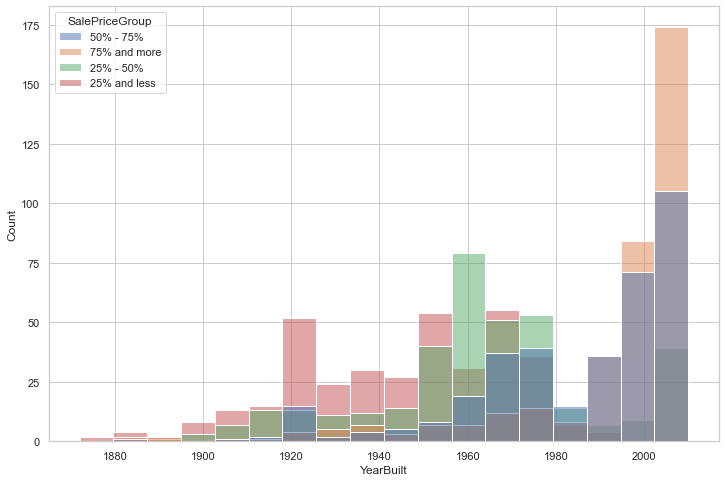

In [48]:
sns.histplot(data=full_df, x='YearBuilt', hue='SalePriceGroup')

Most of the cheap houses (<50% tier) were built in between of 1872 and 1970
Expensive houses (>50% tier) had been built after that time.

We can assume that people prefer to buy newly build houses. They may have better condition and better building techniques involved. 

Are there any houses that were sold exactly in a year they had been built/remodeled?

In [228]:
full_df[full_df['YearBuilt'] == full_df['YrSold'].astype(int)][['YearBuilt', 'YrSold']]

,YearBuilt,YrSold
58,2006,2006
87,2009,2009
112,2007,2007
167,2007,2007
196,2007,2007
...,...,...
2687,2006,2006
2688,2006,2006
2689,2006,2006
2831,2006,2006


In [229]:
full_df[full_df['YearRemodAdd'] == full_df['YrSold'].astype(int)][['YearBuilt', 'YrSold']]

,YearBuilt,YrSold
11,2005,2006
13,2006,2007
20,2005,2006
58,2006,2006
87,2009,2009
...,...,...
2857,2005,2006
2864,2005,2006
2894,2005,2006
2902,2005,2006


todo: rewrite as I was wrong about this one. There are houses like that

Surprisingly, there are no such houses. How did remodeling impact the sale price?

<AxesSubplot:xlabel='YearRemodAdd', ylabel='Count'>

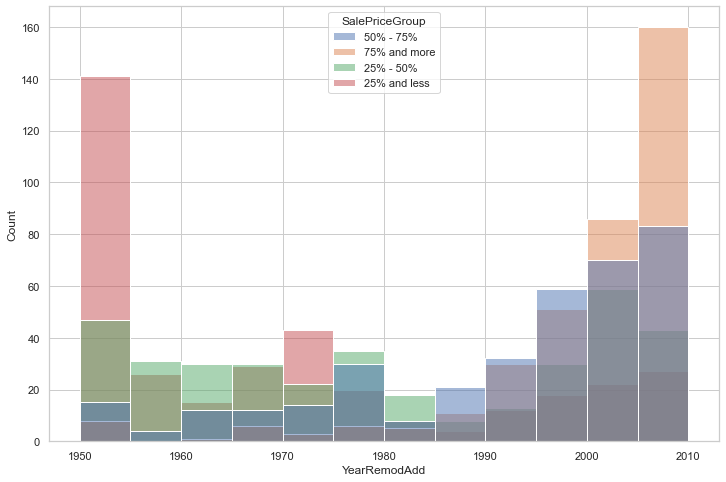

In [50]:
sns.histplot(data=full_df, x='YearRemodAdd', hue='SalePriceGroup')

Recently remodeled houses had **higher price**. Remodeling improves condition of the house, so there is no surprises.

Let's check how time that passed since remodeling impacts sale price:

<AxesSubplot:xlabel='YearsSinceBuilt', ylabel='Count'>

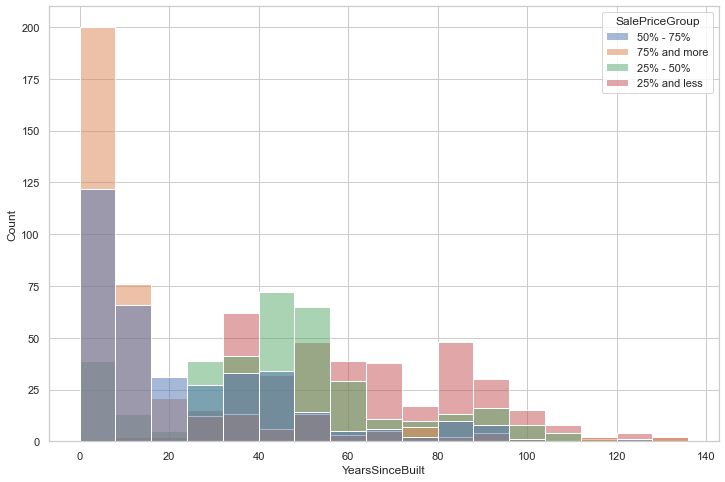

In [104]:
full_df['YearsSinceBuilt'] = full_df['YrSold'].astype(int) - full_df['YearBuilt'].astype(int)
full_df['YearsSinceRemod'] = full_df['YrSold'].astype(int) - full_df['YearRemodAdd'].astype(int)
full_df['Remodeled'] = (full_df['YearRemodAdd'] != full_df['YearBuilt']) * 1

sns.histplot(data=full_df, x='YearsSinceBuilt', hue='SalePriceGroup')

<AxesSubplot:xlabel='YearsSinceRemod', ylabel='Count'>

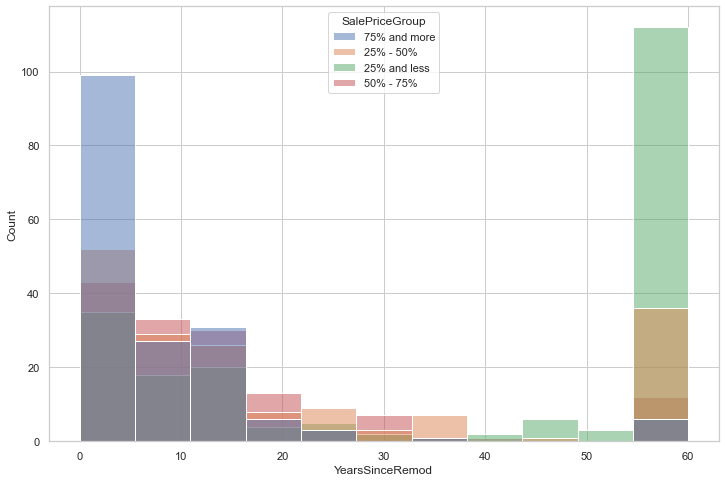

In [101]:
sns.histplot(data=full_df[full_df['Remodeled'] == 1], x='YearsSinceRemod', hue='SalePriceGroup')

As we can see, the longer time has passed since built/remodeling the cheaper house would be. Namely, most of expensive houses had been remodeled **25 years ago or less** before they were sold. Also, the most expensive houses were built **20 years ago or less**.

Needs to say that the exact year of building or remodeling is not important for us and may bring a lot of noice to the model. We would like to **bin age metrics** instead using **10-20** year bins (pretty much like on the plots).

### House Access

<img src="https://i.dailymail.co.uk/i/pix/2014/07/31/article-2712017-2028C76F00000578-277_634x458.jpg" />

<AxesSubplot:xlabel='count', ylabel='Street'>

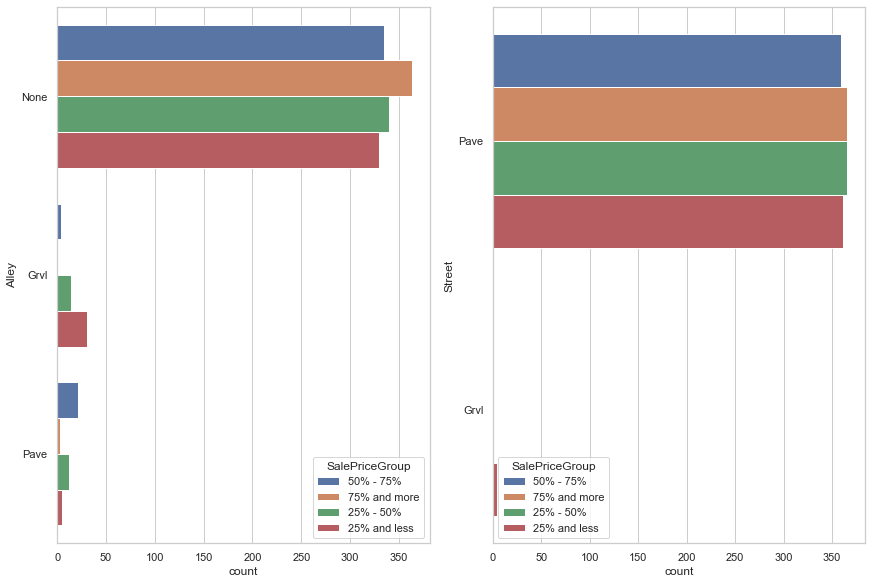

In [55]:
# Most of houses that have SalePrice < 50% connected with gravel alleys or gravel streets.

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='Alley', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='Street', hue='SalePriceGroup', ax=ax[1])

Most of the houses have paved drive:

<AxesSubplot:xlabel='count', ylabel='PavedDrive'>

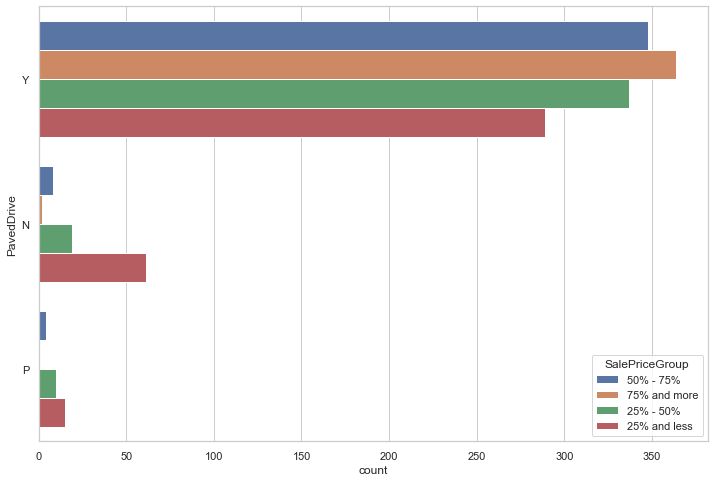

In [56]:
sns.countplot(data=full_df, y='PavedDrive', hue='SalePriceGroup')

We can reduce amount of noice by convering **PavedDrive** feature into a flag:

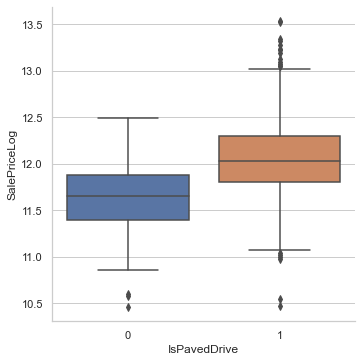

In [161]:
full_df['IsPavedDrive'] = (full_df['PavedDrive'] == 'Y') * 1

sns.catplot(data=full_df, x='IsPavedDrive', y='SalePriceLog', kind='box')

### House Location: Neighborhood, Zoning and Additional Conditions

<img src="https://www.lendinghome.com/blog/wp-content/uploads/2018/11/houses-in-the-same-neighborhood.jpg" width="600px" />

**Neighborhood** and **MSZoning** do correlate with **SalePrice**.

**Neighborhood** Insights

- Neighborhoods with house price below the mean: IDOTRR, Swisu, DrDale, NPkVill, MeadowV, Sawyer, OldTown, Edwards, NAmes
- Neighborhoods with house price above the mean: NoRidge, Mitchel, Crawfor, SawyerW, Timber, Somerst, CollgeCr, Gilbert, NWAmes
- Neighborhoods with house price above 75% perct: NridgHt, CollgeCr, Crawfor, Timber, StoreBr

**Zoning** Insights:
- Zoning with house price above the mean: RL, FV
- Zoning with house price below the mean: RM, C, RH

More Information: https://www.investopedia.com/terms/z/zoning.asp#:~:text=Zoning%20allows%20lo

<AxesSubplot:xlabel='count', ylabel='MSZoning'>

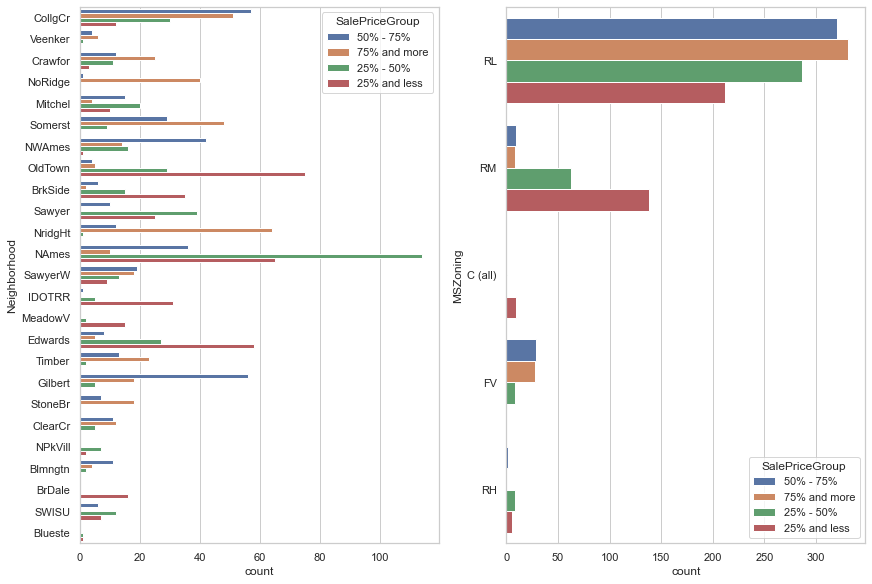

In [223]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='Neighborhood', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=fullDf, y='MSZoning', hue='SalePriceGroup', ax=ax[1])

Based on list of neighborhoods where expensive houses tended to be sold, we can call them **"elite" neighborhoods** and create a flag to mark them:

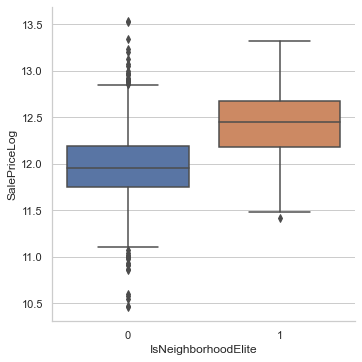

In [221]:
full_df['IsNeighborhoodElite'] = (full_df['Neighborhood'].isin(['NridgHt', 'CollgeCr', 'Crawfor', 'StoreBr', 'Timber'])) * 1

sns.catplot(data=full_df, x='IsNeighborhoodElite', y='SalePriceLog', kind='box')

**Condition1** and **Condition2** features represent additional location advantages or disadvantages:
- a lot might be adjacent or near off site park or forest (house sale price goes up)
- a lot might be adjacent or near noisy street or railroad (house sale price goes down)

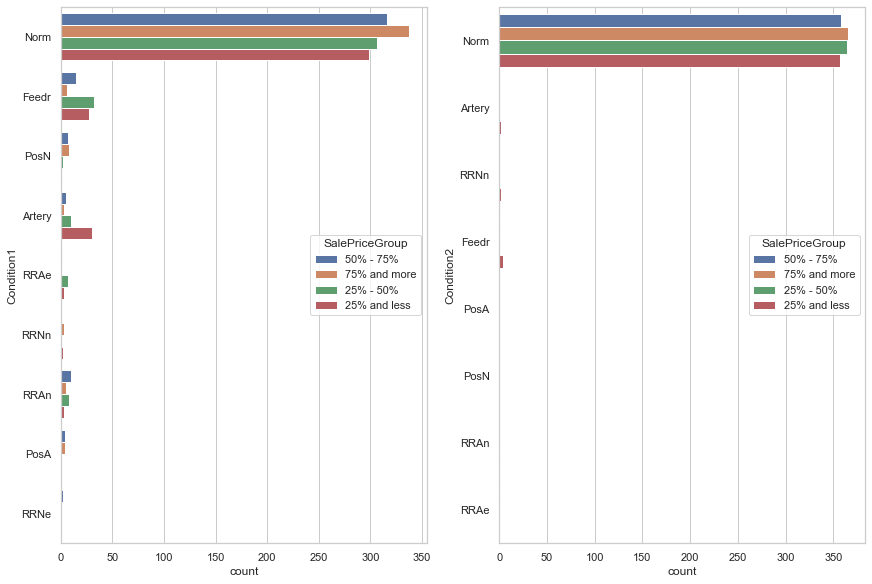

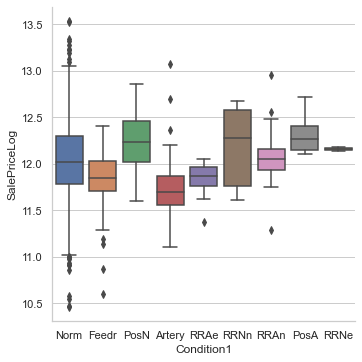

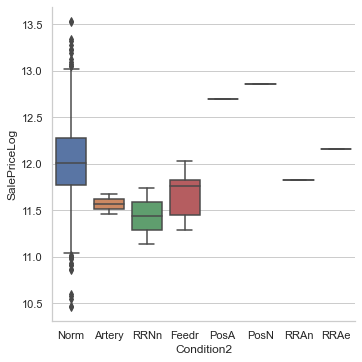

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='Condition1', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='Condition2', hue='SalePriceGroup', ax=ax[1])

sns.catplot(data=full_df, x='Condition1', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='Condition2', y='SalePriceLog', kind='box')

Since **Condition1** and **Condition2** describes the same set of conditions, we can merge them into a few flags:
- Is Adjacent to Arterial Street?
- Is Adjacent to Feeder Street?
- Is Adjacent to Railroad?
- Is Near to Feeder Street?
- Is Adjacent to Offsite Feature?
- Is Near to Offsite Feature?

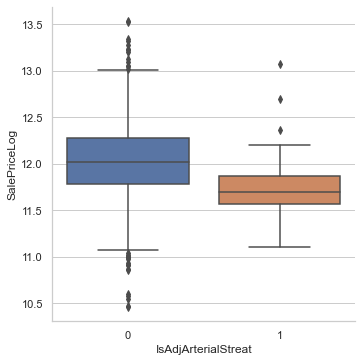

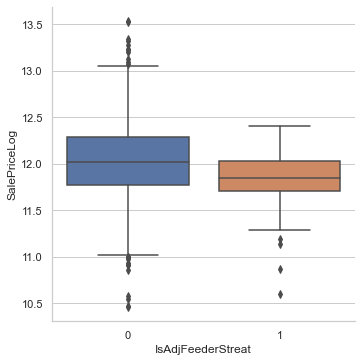

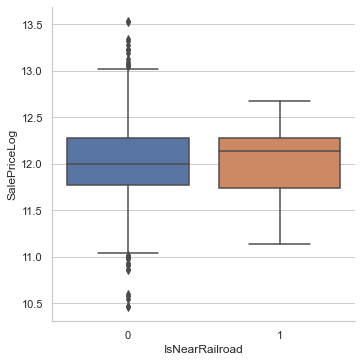

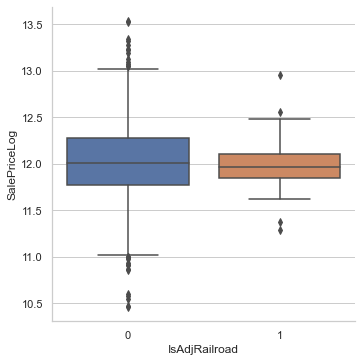

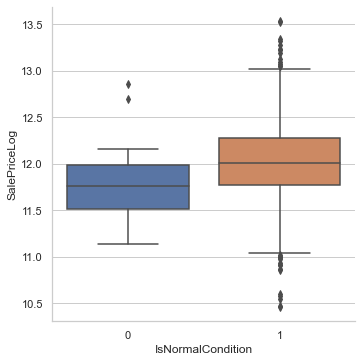

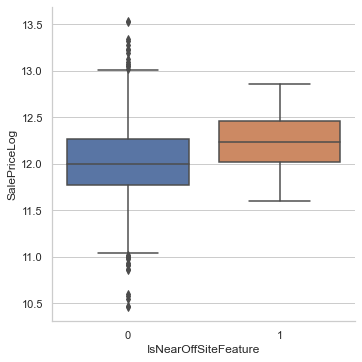

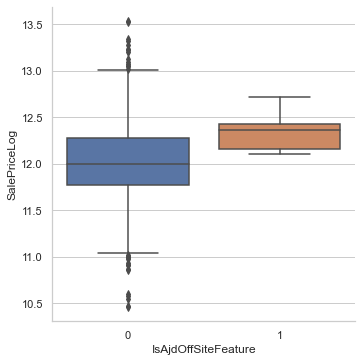

In [38]:
full_df['IsAdjArterialStreat'] = ((full_df['Condition1'] == 'Artery') | (full_df['Condition2'] == 'Artery')) * 1
full_df['IsAdjFeederStreat'] = ((full_df['Condition1'] == 'Feedr') | (full_df['Condition2'] == 'Feedr')) * 1
full_df['IsNormalCondition'] = ((full_df['Condition1'] == 'Norm') | (full_df['Condition2'] == 'Norm')) * 1
full_df['IsAjdOffSiteFeature'] = ((full_df['Condition1'] == 'PosA') | (full_df['Condition2'] == 'PosA')) * 1
full_df['IsNearOffSiteFeature'] = ((full_df['Condition1'] == 'PosN') | (full_df['Condition2'] == 'PosN')) * 1
full_df['IsNearRailroad'] = ((full_df['Condition1'].isin(['RRNn', 'RRNe'])) | (full_df['Condition2'].isin(['RRNn', 'RRNe']))) * 1
full_df['IsAdjRailroad'] = ((full_df['Condition1'].isin(['RRAn', 'RRAe'])) | (full_df['Condition2'].isin(['RRAn', 'RRAe']))) * 1

sns.catplot(data=full_df, x='IsAdjArterialStreat', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsAdjFeederStreat', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsNearRailroad', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsAdjRailroad', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsNormalCondition', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsNearOffSiteFeature', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsAjdOffSiteFeature', y='SalePriceLog', kind='box')

### Roof Properties

<img src="https://i.pinimg.com/originals/c7/88/e9/c788e90182e94319aecb6629ddfcede2.jpg" />

**Gable** and **hip** are two the most popular **roof styles** in the training set. The most popular **roof material** is composite shingles:

More Info:
- http://aroyalroofing.com/composite-shingles/

<AxesSubplot:xlabel='count', ylabel='RoofMatl'>

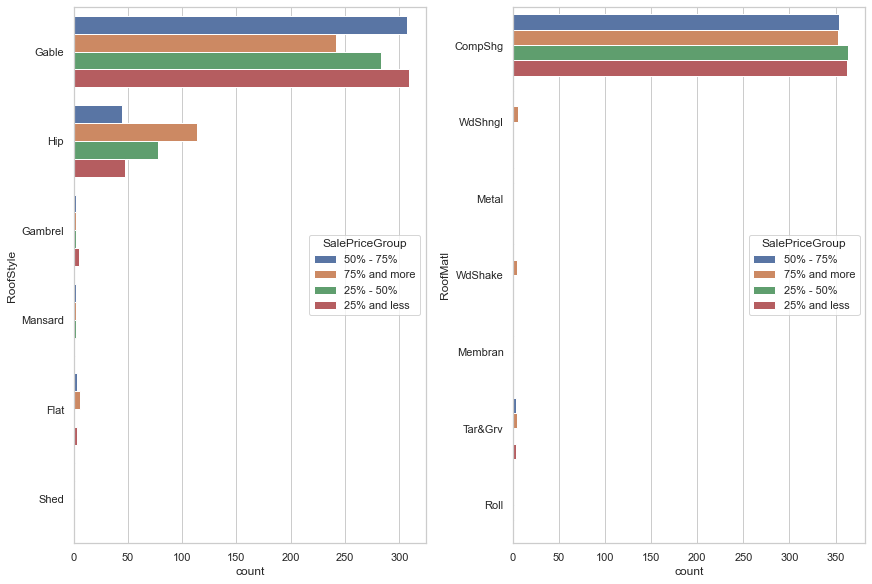

In [59]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='RoofStyle', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='RoofMatl', hue='SalePriceGroup', ax=ax[1])

**Roof material** correlates with house prices.

Here is an overview of roofing materials:
- **Composite Shingle** - organic or fiberglass base that is saturated with asphalt, coated on the bottom side with asphalt, and the exposed surface impregnated with small chips of slate, schist, quartz, or ceramic granules. **The most popular option** of all roofing materials (5 dollars/$ft^2$, 15-40 years lifetime) 
- **Wood Shingle** - made from thin, wedge-shaped pieces of natural wood, such as cedar or yellow pine, which are sawn from logs (8.25 dollars/$ft^2$, 25-30 years lifetime)
- **Roll Roofing** -  is made from large rolls of the same material used in composite shingles. It is frequently used in covering of sheds and small shops rather than houses (**2.5 dollars/$ft^2$**, 5-10 years lifetime)
- **Built-Up Roofing (Tar & Grv)** - a layered roof that is created by alternating layers of roofing felt and waterproof materials such as fiberglass, and hot tar (4 dollars/$ft^2$, 20-30 years lifetime)
- **Wood Shake** - thicker material than wood shingles, and they can be expected to stand up better than wood shingles to weather and UV rays (13 dollars/$ft^2$, 35-40 years)
- **Metal Roofing** - made from large steel panels laid on the roof deck with the seams overlapping in raised ridges that run vertically along the roof slope (13.6 dollars/$ft^2$, 30-50 years lifetime)
- **Clay Tile** - made from terracotta clay, but there are also ceramic tiles roofs (17.5 dollars/$ft^2$, 100 years lifetime)

**Wood** seem to be the most expensive material. 

More Info:
- https://www.inexroofingco.com/services/wood-shakes/
- https://nrc4help.com/tar-gravel-roof
- https://www.thespruce.com/rolled-roofing-1821945
- https://www.archtoolbox.com/materials-systems/thermal-moisture-protection/flat-roof-membranes.html
- https://www.diorconstruction.com/4-benefits-of-wood-shake-roofing/
- https://www.thespruce.com/best-roofing-materials-for-longevity-1821951

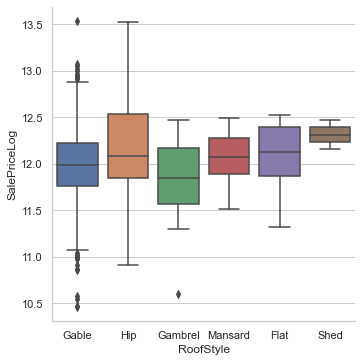

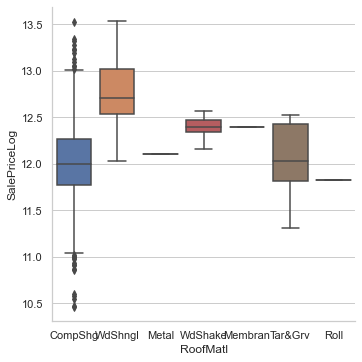

In [269]:
sns.catplot(data=full_df, x='RoofMatl', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='RoofStyle', y='SalePriceLog', kind='box')

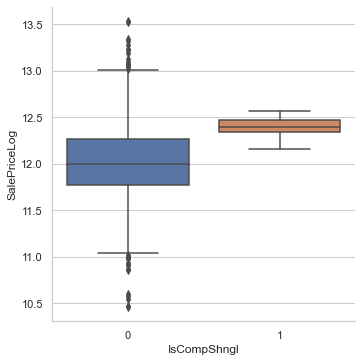

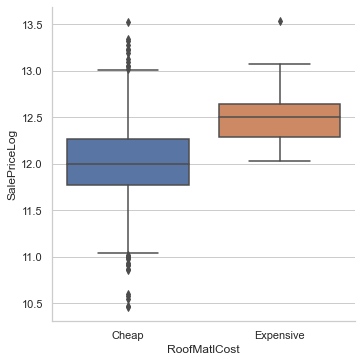

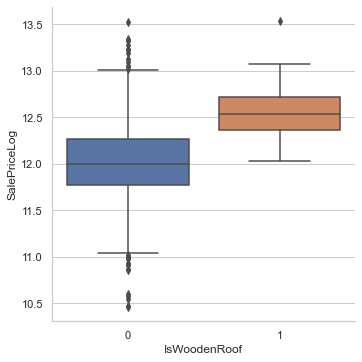

In [277]:
full_df['RoofMatlCost'] = full_df['RoofMatl'].map({
    'CompShg': 'Cheap',
    'WdShake': 'Expensive',
    'ClyTile': 'Expensive',
    'WdShngl': 'Expensive',
    'Roll': 'Cheap',
    'Metal': 'Expensive',
    'Membran': 'Cheap',
    'Tar&Grv': 'Cheap',
})

full_df['IsWoodenRoof'] = full_df['RoofMatl'].map({
    'CompShg': 0,
    'WdShake': 1,
    'ClyTile': 0,
    'WdShngl': 1,
    'Roll': 0,
    'Metal': 0,
    'Membran': 0,
    'Tar&Grv': 0,
})

full_df['IsCompShngl'] = full_df['RoofMatl'].map({
    'CompShg': 1,
    'WdShake': 0,
    'ClyTile': 0,
    'WdShngl': 0,
    'Roll': 0,
    'Metal': 0,
    'Membran': 0,
    'Tar&Grv': 0,
})

sns.catplot(data=full_df, x='IsCompShngl', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='RoofMatlCost', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsWoodenRoof', y='SalePriceLog', kind='box')

### House Exterior Properties

<img src="https://i.pinimg.com/originals/f7/89/62/f7896244b88d71a376c8bfb3f3a7d95f.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='Exterior2nd'>

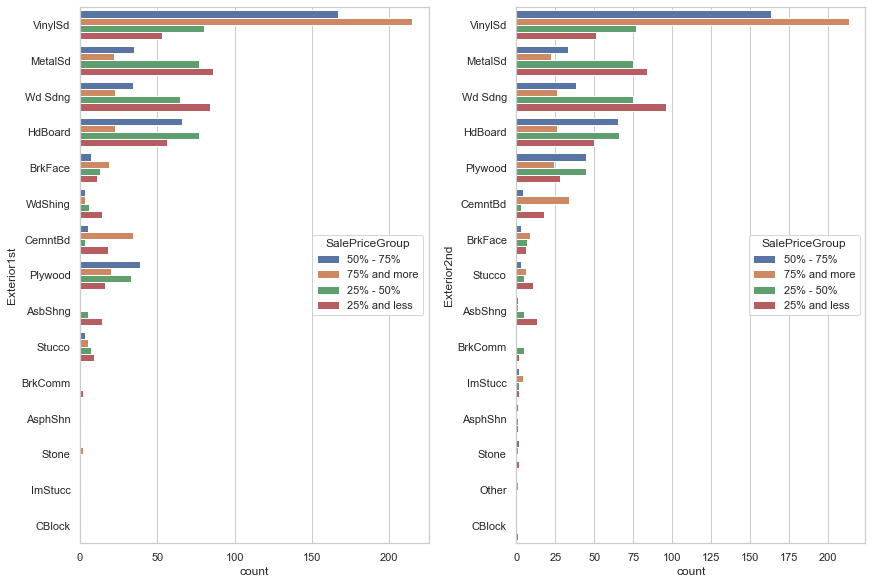

In [60]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=fullDf, y="Exterior1st", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="Exterior2nd", hue="SalePriceGroup", ax=ax[1])

### Masonry Veneer

<img src="https://static.secure.website/wscfus/10286973/5368169/img-20170313-163056212-hdr-w1920-o.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='MasVnrType'>

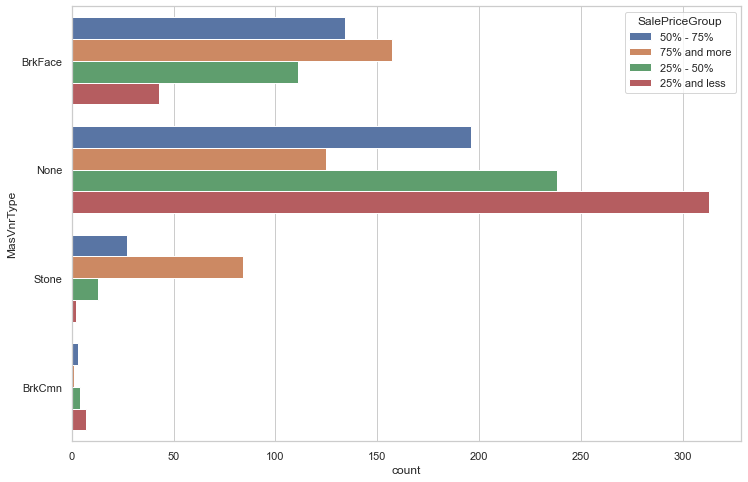

In [61]:
# ?
sns.countplot(data=full_df, y='MasVnrType', hue='SalePriceGroup')

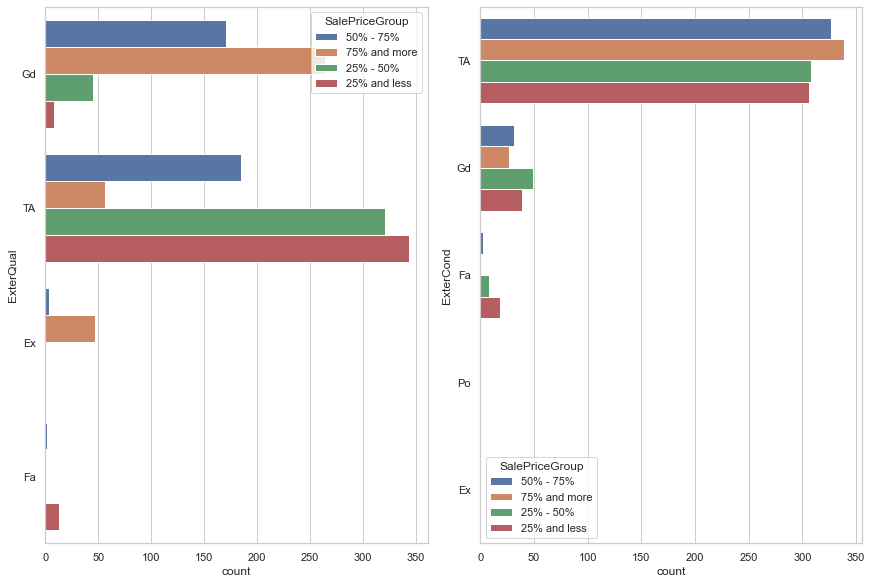

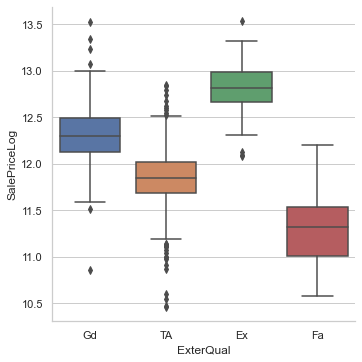

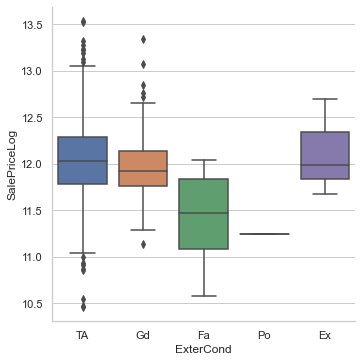

In [234]:
# Houses with SalePrice > 75% percentile have mostly good or excellent exterior quality. They also have average or good conditions.

## Houses with SalePrice < 50% percentile have mostly average quality and average condition.

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='ExterQual', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='ExterCond', hue='SalePriceGroup', ax=ax[1])

sns.catplot(data=full_df, x='ExterQual', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='ExterCond', y='SalePriceLog', kind='box')

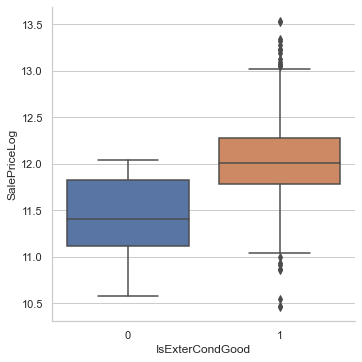

In [235]:
full_df['IsExterCondGood'] = full_df['ExterCond'].map({'Po': 0, 'Fa': 0, 'TA': 1, 'Gd': 1, 'Ex': 1})

sns.catplot(data=full_df, x='IsExterCondGood', y='SalePriceLog', kind='box')

### Heating, Air Condition and Electrical Systems, Utilities

<img src="https://www.longrefrigeration.com/wp-content/uploads/2018/01/Depositphotos_84681734_m-2015.jpg" width="600px" />

Heating Types does differentiate samples with sale price below the mean.

Wall, gravity, floor furneses and other heating were installed in houses that cheaper than 50% tier.

It seems like the mentioned heating systems are old fashion. 

Here is the YearBuilt ranges:
- Grav - 1910-1941
- Floor - 1949
- OthW - 1872-1917
- Wall - 1945-1952
- GasW - 1880-1970
- GasA - 1875-2010

Most houses with SalePrice > 50% have from excellent to average quality of heating. Lower quality types includes mostly houses from < 50% tier.

More Info: 
- https://www.nachi.org/gravity-furnace-inspection.htm
- https://www.billhowe.com/blog/what-is-wall-furnace
- https://sandium.com/hvac-technology/all-you-need-to-know-about-floor-furnace.html

<AxesSubplot:xlabel='count', ylabel='HeatingQC'>

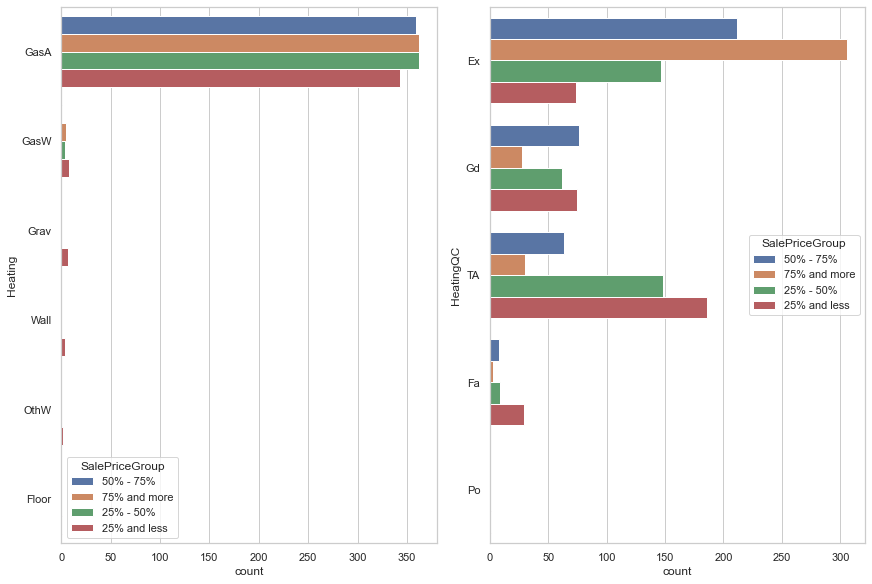

In [241]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='Heating', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='HeatingQC', hue='SalePriceGroup', ax=ax[1])

Based on this information, let's engineer new features that:
- indicate gas-based heating systems (modern type of heating)
- simplify heating ranking and introduce **IsHeatingGood** flag

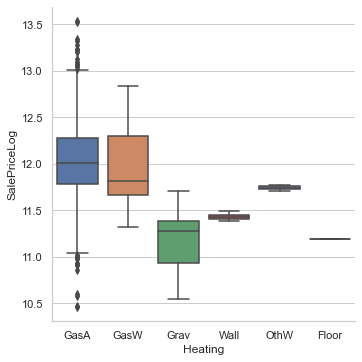

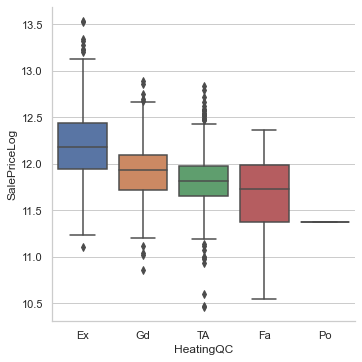

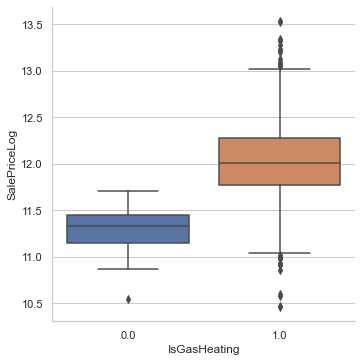

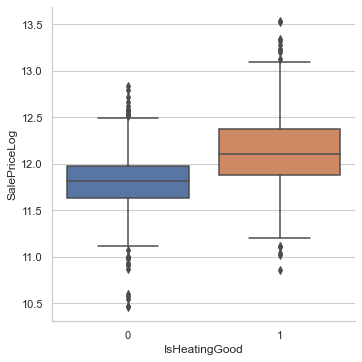

In [245]:
full_df['IsGasHeating'] = full_df['Heating'].map({'GasA': 1, 'GasW': 1, 'Grav': 0, 'Wall': 0, 'OtherW': 0, 'Floor': 0})
full_df['IsHeatingGood'] = full_df['HeatingQC'].map({'Po': 0, 'Fa': 0, 'TA': 0, 'Gd': 1, 'Ex': 1})

sns.catplot(data=full_df, x='Heating', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='HeatingQC', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsGasHeating', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsHeatingGood', y='SalePriceLog', kind='box')

**Central AC** seems to be an popular house feature. Most of the houses from >50% tier had it. It was not installed in cheap (<25% tier) houses.

More Info:
- https://www.thisoldhouse.com/heating-cooling/21018992/read-this-before-you-install-central-air-conditioning

Most of the houses have Standard Circuit Breakers type of **Electricity**. Houses from >50% tier dominates there. The rest of options (which is fuse boxes) are hold by <50% houses. Fuse Boxes were normally installed in old-built houses.

More Info:
- http://www.icanfixupmyhome.com/Understanding_Home_Wiring.html
- https://www.thespruce.com/fuses-and-fuse-boxes-101-4122558

<AxesSubplot:xlabel='count', ylabel='Electrical'>

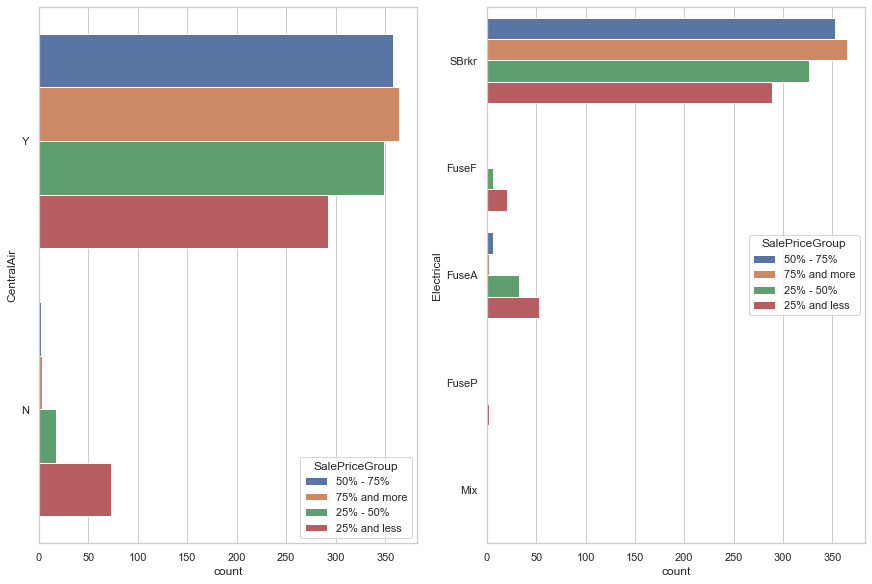

In [64]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='CentralAir', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='Electrical', hue='SalePriceGroup', ax=ax[1])

**Electrical** feature seems to have more information that we need. It can be reduced to a flag features that indicated whenever a house had modern electrical breakers or old-fashion fuse boxes:

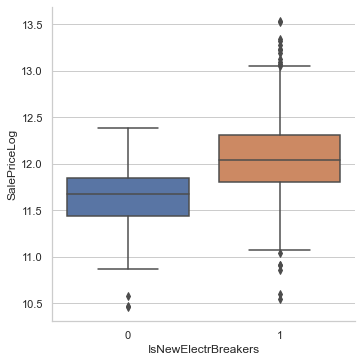

In [246]:
full_df['IsNewElectrBreakers'] = full_df['Electrical'].map({'SBrkr': 1, 'FuseF': 0, 'FuseA': 0, 'FuseP': 0, 'Mix': 0})

sns.catplot(data=full_df, x='IsNewElectrBreakers', y='SalePriceLog', kind='box')

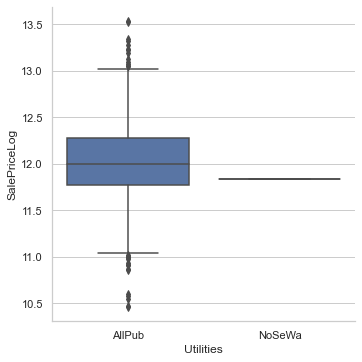

In [247]:
sns.catplot(data=full_df, x='Utilities', y='SalePriceLog', kind='box')

In [66]:
fullDf[fullDf['Utilities'] != 'AllPub']

,1stFlrSF,2ndFlrSF,3SsnPorch,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,...,GarageCondEnc,PoolQCEnc,FenceEnc,PavedDriveEnc,CentralAirEnc,AlleyEnc,StreetEnc,SalePriceGroup,YearsSinceRemod,Remodeled
944,1344,0,0,None,3,1Fam,TA,No,111.0,354.0,...,3,0,0,2,1,0,0,25% - 50%,51,0


Most of the houses have "AllPub" **Utilities** feature has only one value in the dataset. There are a few NaN values and one "NoSeWa". It should be safe to drop this feature.

### Kitchen Properties

<img src="https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/ph163819-priority-1580934887.jpg" width="600px" />

**Kitchen** is an important part of any house. There two metrics that decribe lot kitchens:

<AxesSubplot:xlabel='count', ylabel='KitchenAbvGr'>

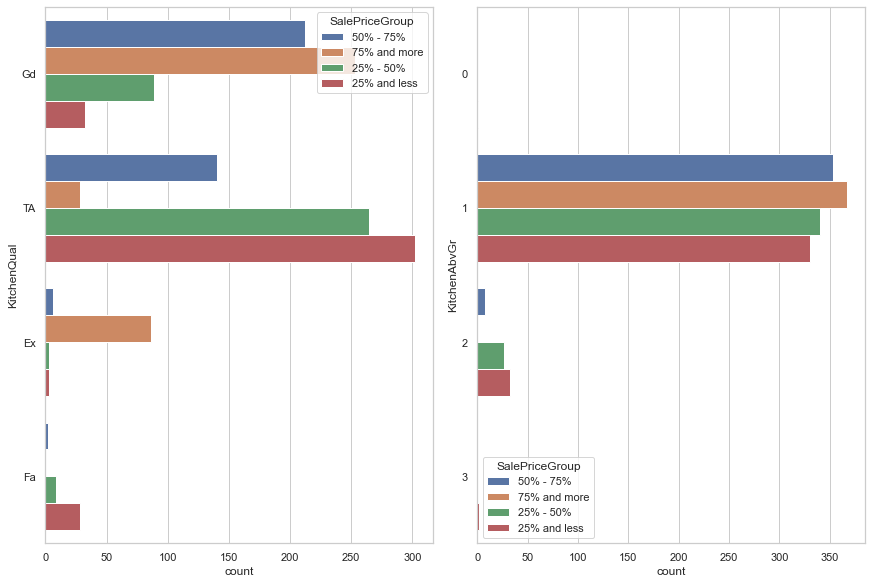

In [67]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='KitchenQual', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='KitchenAbvGr', hue='SalePriceGroup', ax=ax[1])

We can think about single metric to combine kitchen number and quality. With a help of binning, we can divide all houses into "Bad Quality" and "Good Quality" kitchens:

<AxesSubplot:xlabel='count', ylabel='KitchenQC'>

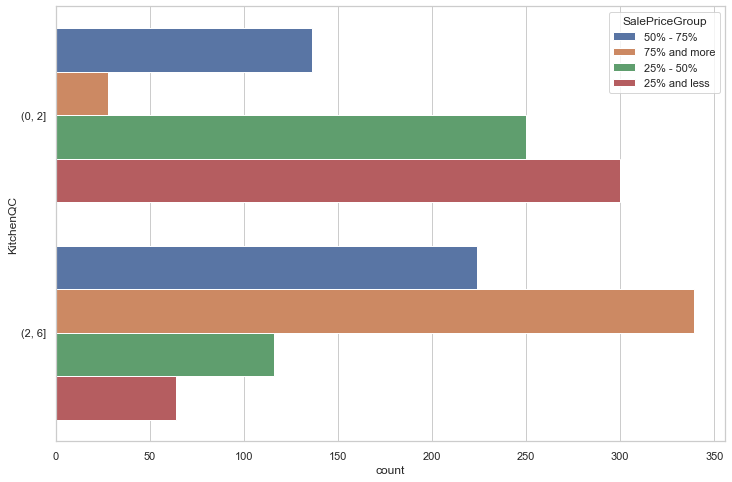

In [181]:
full_df['KitchenQC'] = pd.cut(full_df['KitchenQualEnc'] * full_df['KitchenAbvGr'], [0, 2, 6])

sns.countplot(data=full_df, y='KitchenQC', hue='SalePriceGroup')

### Bathroom Properties

<img src="https://na.rdcpix.com/953932278/9ab1219892c704d4811c173a86816eb4w-c0xd-w685_h860_q80.jpg" />

**Bathrooms** are also important and there two types of bathrooms: 
- full bathrooms - a sink, a shower, a bathtub, and a toilet
- and half bathrooms - a toilet and a sink only

Bathrooms can be located above ground or in the basement.

More Information: 
* https://www.realtor.com/advice/sell/if-i-take-out-the-tub-does-a-bathroom-still-count-as-a-full-bath
* https://www.thetruthaboutrealty.com/half-bath-vs-full-bath-wheres-the-value/

<AxesSubplot:xlabel='count', ylabel='BsmtHalfBath'>

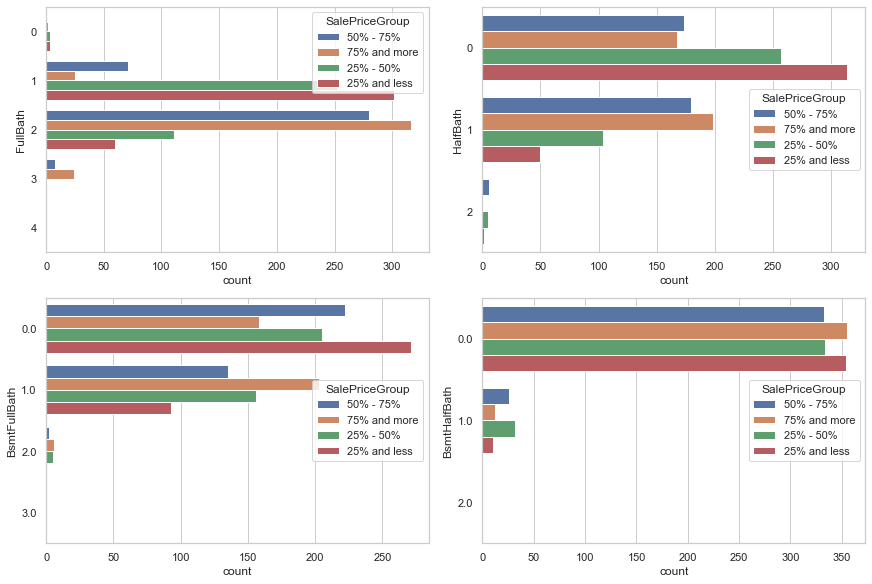

In [182]:
fig, ax = plt.subplots(2, 2, constrained_layout=True)

sns.countplot(data=full_df, y='FullBath', hue='SalePriceGroup', ax=ax[0, 0])
sns.countplot(data=full_df, y='HalfBath', hue='SalePriceGroup', ax=ax[0, 1])

sns.countplot(data=full_df, y='BsmtFullBath', hue='SalePriceGroup', ax=ax[1, 0])
sns.countplot(data=full_df, y='BsmtHalfBath', hue='SalePriceGroup', ax=ax[1, 1])

It's typical to say that house contains one and half bathrooms, so we can think about a simple sum of all bathrooms to describe a house:

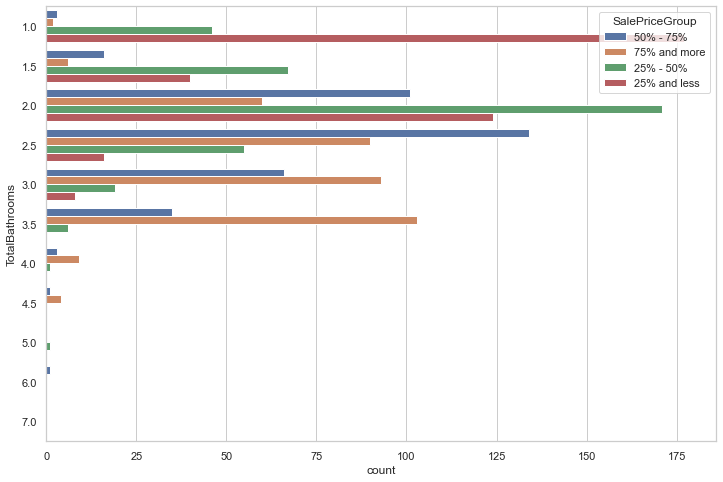

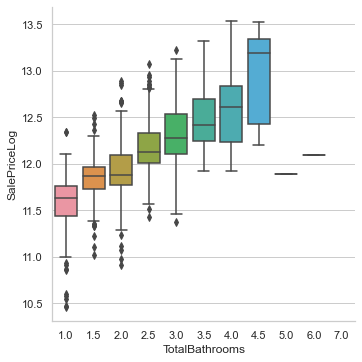

In [185]:
full_df['TotalBathrooms'] = full_df['FullBath'] + (0.5 * full_df['HalfBath']) + \
                                full_df['BsmtFullBath'] + (0.5 * full_df['BsmtHalfBath'])

sns.countplot(data=fullDf, y='TotalBathrooms', hue='SalePriceGroup')
sns.catplot(data=full_df, x='TotalBathrooms', y='SalePriceLog', kind='box')

Sinlge **TotalBathrooms** feature correlates well with **SalePrice**. Sure thing! Everyone wants to have a few bathrooms 😄

### Garage Properties

<img src="https://www.deldenmfg.com/images/homepage-slideshow/home5.jpg" width="600px" />

Attached and Builtin **garage types** dominate among expensive houses (>50% tier). Their garages commonly were built to contain 2 or 3 cars. 
Detached, CarPort types dominates among cheap houses (<50% tier). Their garage capacity is 1 car. No garages are also dominates among cheap houses.

<AxesSubplot:xlabel='count', ylabel='GarageCars'>

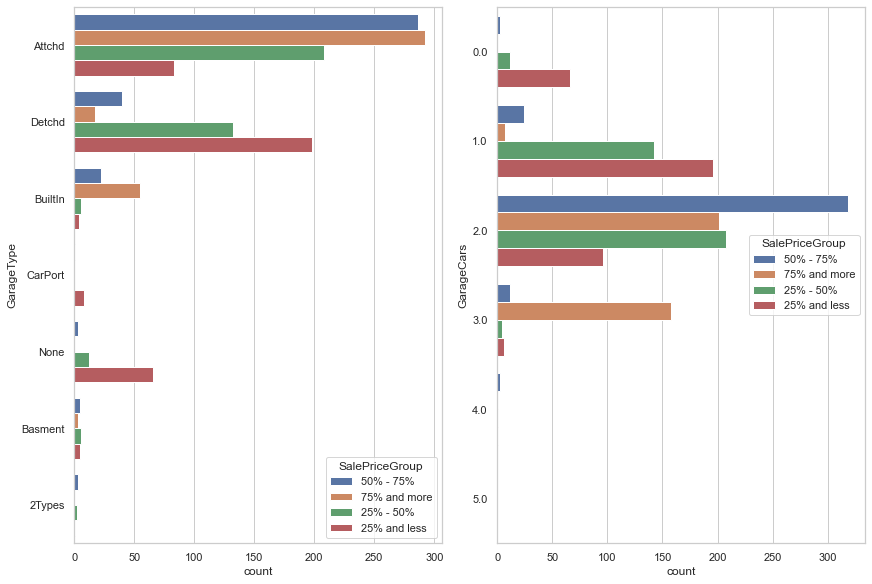

In [256]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='GarageType', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='GarageCars', hue='SalePriceGroup', ax=ax[1])

Also, we can see a correlation between **garage car** capacity and house **sale price**:

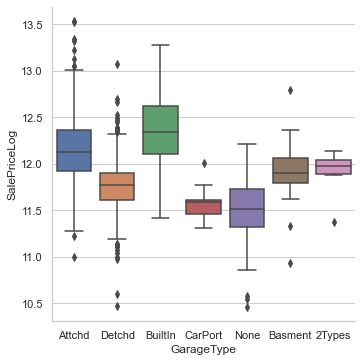

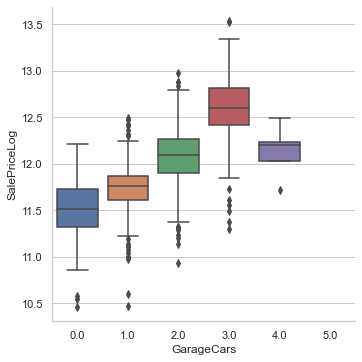

In [257]:
sns.catplot(data=full_df, x='GarageType', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='GarageCars', y='SalePriceLog', kind='box')

Most of garages were in **average** condition and quality:

<AxesSubplot:xlabel='count', ylabel='GarageCond'>

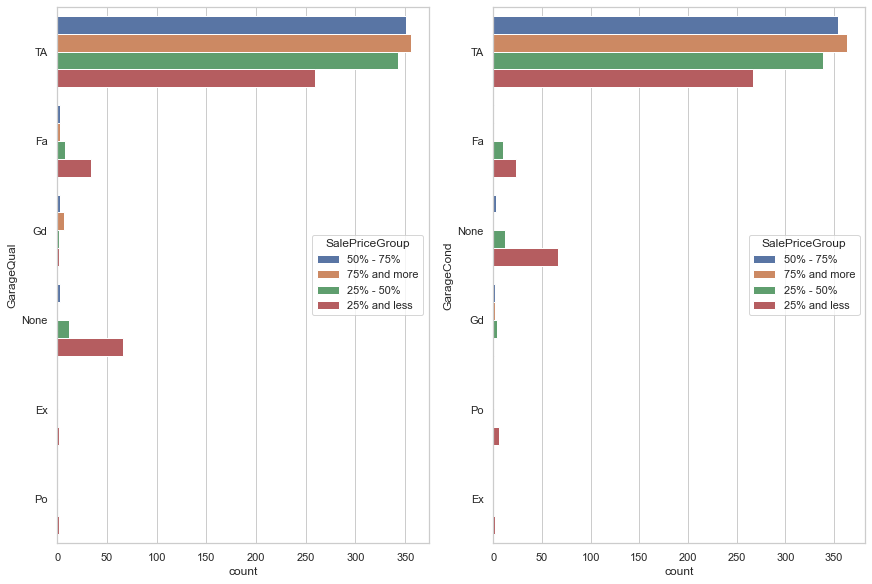

In [70]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='GarageQual', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='GarageCond', hue='SalePriceGroup', ax=ax[1])

To reduce noice in Garage Quality and Condition feature, we reduce them to flags:

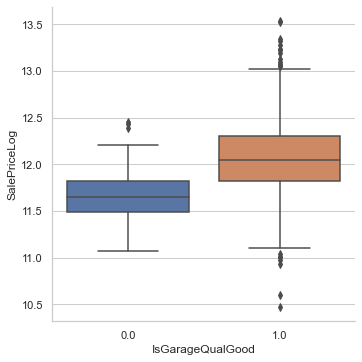

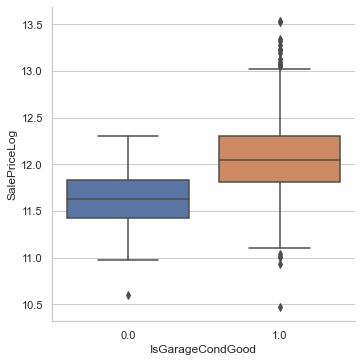

In [259]:
full_df['IsGarageCondGood'] = full_df['GarageCond'].map({'Po': 0, 'Fa': 0, 'TA': 1, 'Gd': 1, 'Ex': 1})
full_df['IsGarageQualGood'] = full_df['GarageQual'].map({'Po': 0, 'Fa': 0, 'TA': 1, 'Gd': 1, 'Ex': 1})

sns.catplot(data=full_df, x='IsGarageQualGood', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsGarageCondGood', y='SalePriceLog', kind='box')

**Finished Garages** were more expensive than unfinished ones. Most of the expensive houses (>50% tier) have finished garages or roughly finished. 

**Unfinished garages** were sold with cheap houses (<50% tier).

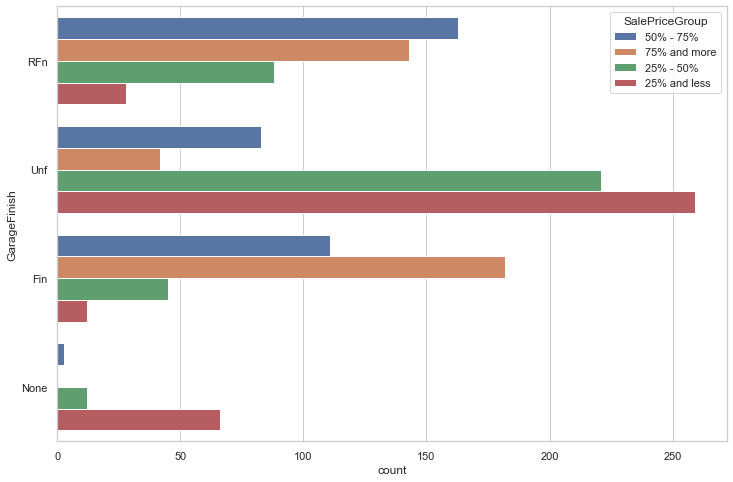

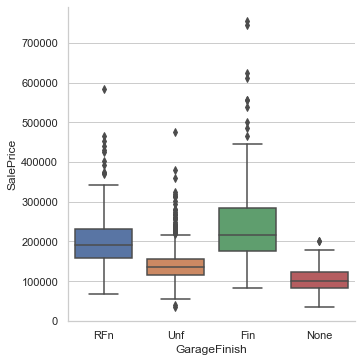

In [71]:
sns.countplot(data=full_df, y='GarageFinish', hue='SalePriceGroup')
sns.catplot(data=full_df, x='GarageFinish', y='SalePrice', kind='box')

**Garage area** correlates with **SalePrice**:

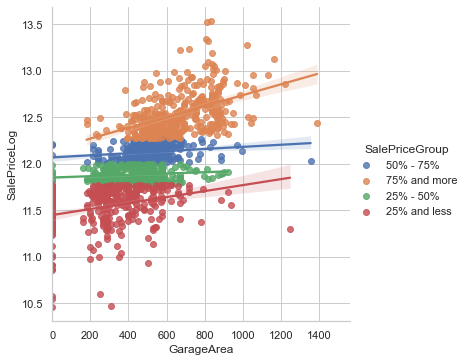

In [260]:
sns.lmplot(data=full_df, x='GarageArea', y='SalePriceLog', hue='SalePriceGroup')

### Wood Deck

<img src="https://padeckbuilder.com/wp-content/uploads/2016/03/Cumaru-deck.jpg" width="600px" />

### Porch

#### Open Porch
<img src="https://imagesvc.meredithcorp.io/v3/mm/image?url=https%3A%2F%2Fstatic.onecms.io%2Fwp-content%2Fuploads%2Fsites%2F24%2F2017%2F03%2Fbefore-after-porch-outdoor-living-room-porch-2395402-1.jpg&q=85" width="600px" />

#### Enclosed Porch

<img src="https://media.angieslist.com/s3fs-public/styles/widescreen_large/public/porch.jpg?itok=yX_vZdbw" width="600px" />

In [ ]:
# https://www.medfordoregonroofers.com/blog/construction-services/what-are-the-benefits-of-enclosed-porches/

#### Three Season Porch

<img src="https://lecybros.com/wp-content/uploads/2018/01/photo-009.jpg?fd06b2" width="600px" />

#### Screen Porch

<img src="https://cdnassets.hw.net/65/55/7098b3b74a659c0e0e47e2a48822/figure-00.jpg" width="600px" />

### Fireplaces
<img src="https://www.fpwhs.com/shop/wp-content/uploads/Skope-E135-LOW.jpg" width="600px" />

Most of the cheap houses (<50%) don't have fireplaces or have one (most of the them are good or below avarage quality). Most of the expensive houses have 1 or 2 fireplaces with excellent, good or average quality.

<AxesSubplot:xlabel='count', ylabel='FireplaceQu'>

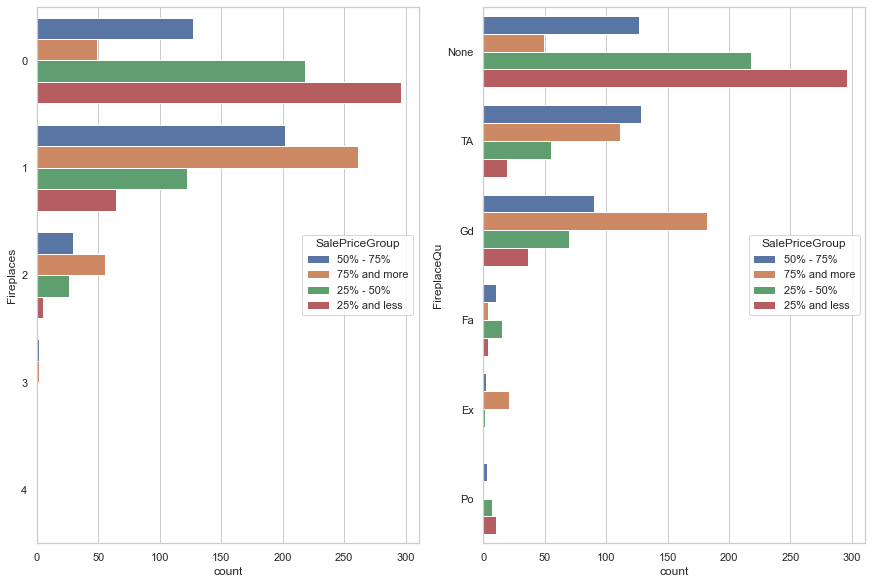

In [72]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="Fireplaces", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="FireplaceQu", hue="SalePriceGroup", ax=ax[1])

### Pool
<img src="https://upload.wikimedia.org/wikipedia/commons/9/92/Backyardpool.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='PoolQC'>

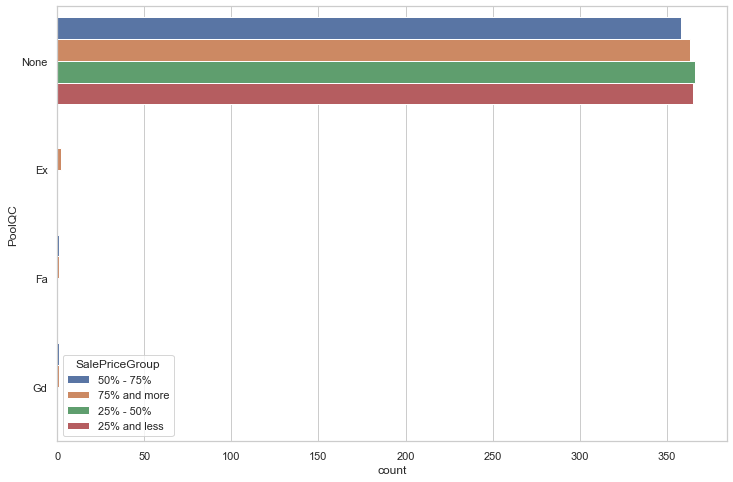

In [73]:
# Just a few lots have pools. None of houses that are cheaper than 25% have pools.
# There is an outlier with SalePrice < 50% and pool installed

sns.countplot(data=full_df, y='PoolQC', hue='SalePriceGroup')

In [74]:
# Outlier

fullDf[(fullDf["SalePriceGroup"] == "25% - 50%") & (fullDf["PoolQC"] == 'Gd')][[
    'SalePrice',
    'PoolQC',
    'PoolArea',
    'TotRmsAbvGrd',
    'LotArea',
    'GrLivArea',
    'Neighborhood',
]]

,SalePrice,PoolQC,PoolArea,TotRmsAbvGrd,LotArea,GrLivArea,Neighborhood


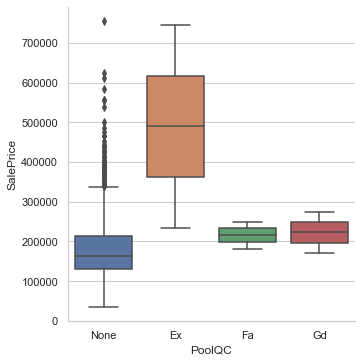

In [75]:
# ?
sns.catplot(data=fullDf, x="PoolQC", y="SalePrice", kind="box")

### Fence

<img src="https://irp-cdn.multiscreensite.com/953fb570/dms3rep/multi/fence-installation-repair-services.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='Fence'>

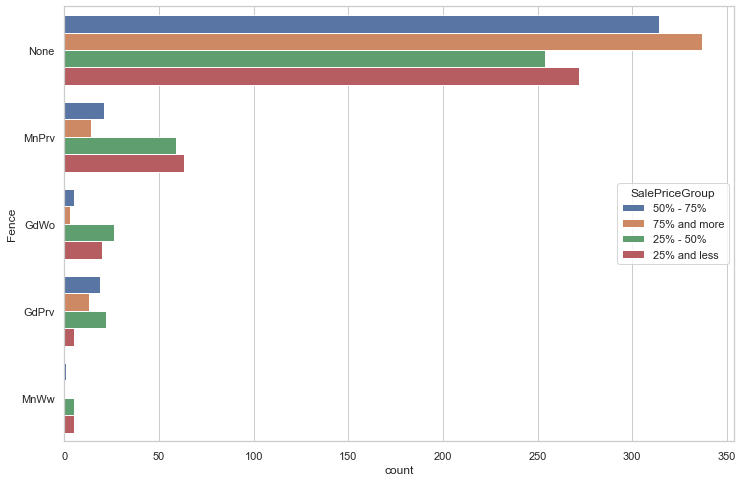

In [76]:
# Expensive houses (>50%) have good privacy/wood fences. Cheap houses (<50%) have minimal privacy/wood fences.

sns.countplot(data=fullDf, y="Fence", hue="SalePriceGroup")

### Misc Features

<img src="https://www.homebase.co.uk/-/media/uk%20images/homebase/ideas%20and%20advice/garden%20and%20outdoor/shed%20garden%20buildings%20and%20storage/how%20to%20build%20a%20shed/h2-build-a-shed-header-image-960x480.jpeg" width="600px" />

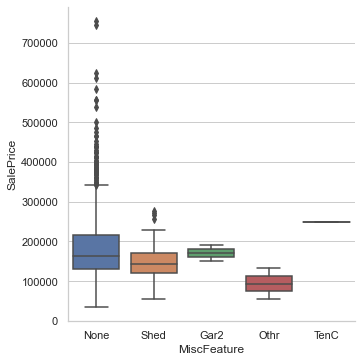

In [77]:
sns.catplot(data=full_df, x='MiscFeature', y='SalePrice', kind='box')

### Sale Information

<AxesSubplot:xlabel='count', ylabel='SaleCondition'>

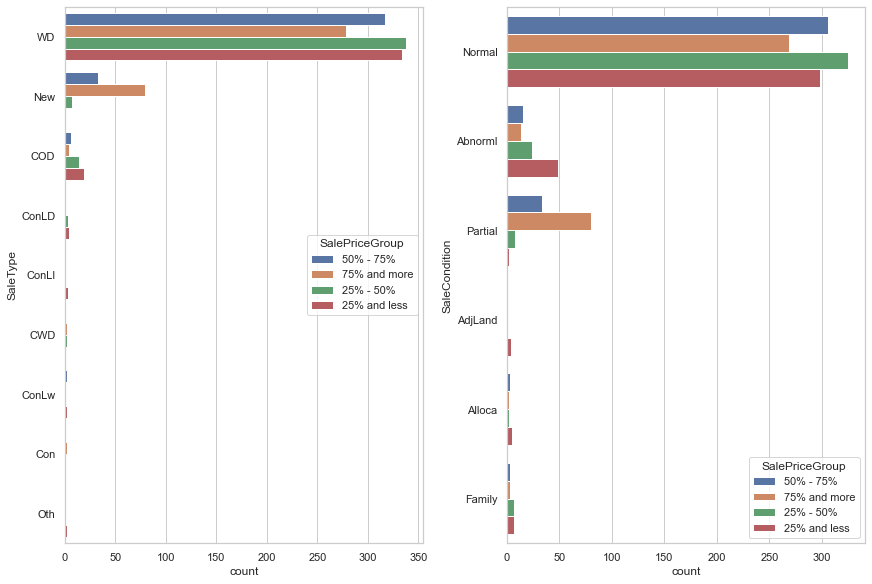

In [78]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='SaleType', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='SaleCondition', hue='SalePriceGroup', ax=ax[1])

<AxesSubplot:xlabel='MoSold,YrSold'>

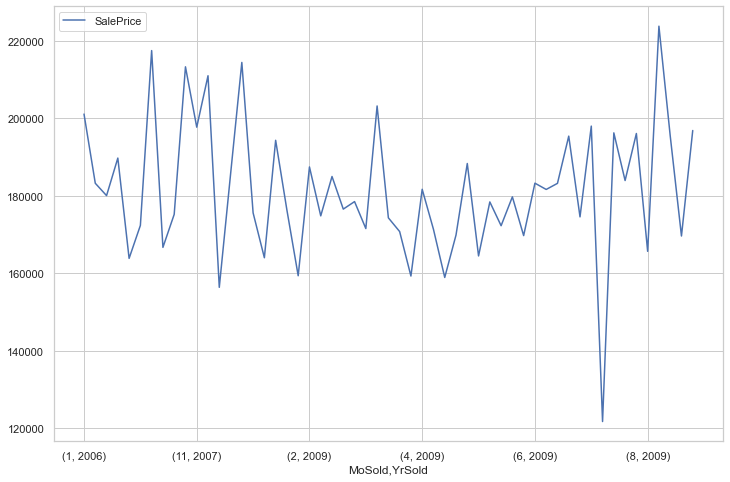

In [80]:
full_df.groupby(['MoSold', 'YrSold'])[['SalePrice']].mean().plot()


## Feature Engineering

Now we need to help our models to reveal more complex relations between house components and SalePrice. Let's start from simple flags that indicate whenever a house has:
* 2nd floor
* Basement
* Garage
* Pool
* Porch
* Fence
* Fireplace
* Masonry Veneer

In [81]:
engineered_df = pd.DataFrame()

engineered_df['Has2ndFloor'] = train_df['2ndFlrSF'].apply(lambda x: int(x > 0))
engineered_df['HasBsmnt'] = train_df['TotalBsmtSF'].apply(lambda x: int(x > 0))
engineered_df['HasGarage'] = train_df['GarageArea'].apply(lambda x: int(x > 0))
engineered_df['HasPool'] = train_df['PoolArea'].apply(lambda x: int(x > 0))
engineered_df['HasFence'] = train_df['Fence'].apply(lambda x: int(x != 'None'))
engineered_df['HasFireplace'] = train_df['Fireplaces'].apply(lambda x: int(x > 0))
engineered_df['HasMasVnr'] = train_df['MasVnrType'].apply(lambda x: int(x != 'None'))

Many house components have quality and condition metrics. Let's try to come up with a simple metrics that describes quantity-quality of components:

House itself and garage have specified years when they were built and/or renovate. This can help us to calculate how old they were at the time of sale:

In [82]:
engineered_df['HouseAge'] = train_df['YrSold'].astype('int') - train_df['YearBuilt'].astype('int')
engineered_df['HouseAgeSinRemod'] = train_df['YrSold'].astype('int') - train_df['YearRemodAdd'].astype('int')

Let's also create location interactions as they are important properties of each lot:

In [83]:
# TBA

In [84]:
engineered_features = list(engineered_df.columns.values)

train_df = train_df.join(engineered_df)
train_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,StreetEnc,Has2ndFloor,HasBsmnt,HasGarage,HasPool,HasFence,HasFireplace,HasMasVnr,HouseAge,HouseAgeSinRemod
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,...,0,1,1,1,0,0,0,1,5,5
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,...,0,0,1,1,0,0,1,0,31,31
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,...,0,1,1,1,0,0,1,1,7,6
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,...,0,1,1,1,0,0,1,0,91,36
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,...,0,1,1,1,0,0,1,1,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,None,Reg,Lvl,AllPub,...,0,1,1,1,0,0,1,0,8,7
1456,1457,20,RL,85.0,13175,Pave,None,Reg,Lvl,AllPub,...,0,0,1,1,0,1,1,1,32,22
1457,1458,70,RL,66.0,9042,Pave,None,Reg,Lvl,AllPub,...,0,1,1,1,0,1,1,0,69,4
1458,1459,20,RL,68.0,9717,Pave,None,Reg,Lvl,AllPub,...,0,0,1,1,0,0,0,0,60,14


## Feature Correlations

Before we go deep into feature relations, let's have an overview of feature correlations and importance (and specifically correlations with SalePrice):

<AxesSubplot:>

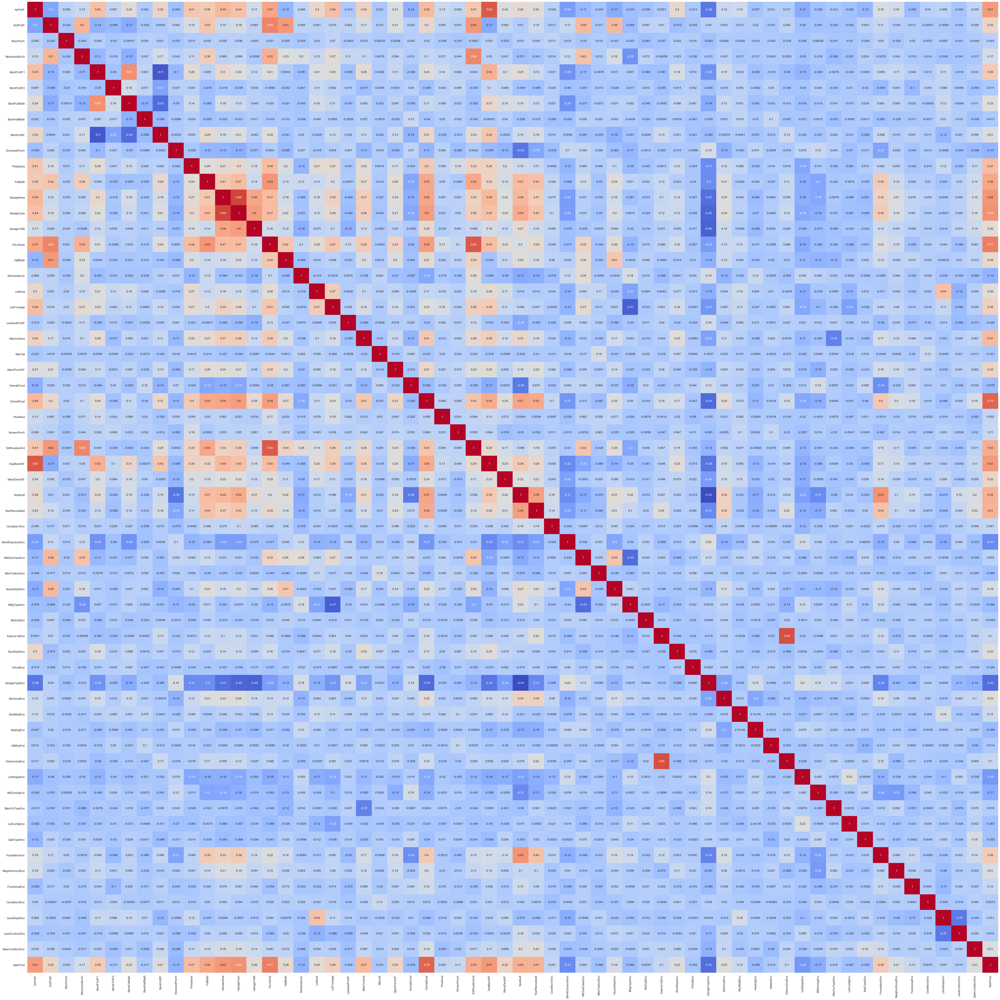

In [85]:
corr_features = num_features + enc_cat_features

plt.figure(figsize=(80, 70))
sns.heatmap(train_df[corr_features + ['SalePrice']].corr(), annot=True, square=True, cmap='coolwarm', cbar=False)

ANOVA Results:

<AxesSubplot:xlabel='feature', ylabel='score'>

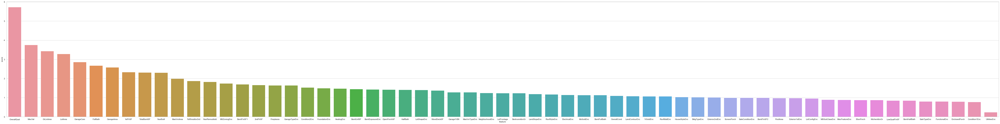

In [86]:
from sklearn.feature_selection import SelectKBest, SelectFromModel, f_classif

anova_feature_selector = SelectKBest(f_classif, k='all')
anova_feature_selector.fit(train_df[corr_features], train_df['SalePrice'])

anova_feature_importance_df = pd.DataFrame({'feature': corr_features, 'score': anova_feature_selector.scores_})
anova_feature_importance_df.sort_values(by=['score'], ascending=[0], inplace=True)

plt.figure(figsize=(100, 12))
sns.barplot(data=anova_feature_importance_df, x='feature', y='score')

Random Forest Selector Results:

In [87]:
from sklearn.ensemble import RandomForestRegressor

random_forest_regressor = RandomForestRegressor(
    max_depth=15,
    n_estimators=1000,
)

features = num_features + enc_cat_features + engineered_features

rf_selector = SelectFromModel(random_forest_regressor, max_features=30)
rf_selector.fit(train_df[features], train_df['SalePrice'])

temp_X = rf_selector.transform(train_df[features])

selected_features = pd.DataFrame(rf_selector.inverse_transform(temp_X), 
                                 index=train_df[features].index,
                                 columns=train_df[features].columns)

selected_columns = selected_features.columns[selected_features.var() != 0]
selected_columns

Index(['1stFlrSF', '2ndFlrSF', 'BsmtFinSF1', 'GarageArea', 'GarageCars',
       'GrLivArea', 'OverallQual', 'TotalBsmtSF'],
      dtype='object')

Lasso Selector Results:

In [88]:
from sklearn.linear_model import LassoCV

l1_regressor = LassoCV(
    alphas=[0.1, 0.2, 0.4, 0.6, 0.8, 1],
    n_jobs=-1,
    random_state=42,
)

l1_selector = SelectFromModel(l1_regressor, max_features=30)
l1_selector.fit(train_df[features], train_df['SalePrice'])

temp_X = l1_selector.transform(train_df[features])

selected_features = pd.DataFrame(l1_selector.inverse_transform(temp_X), 
                                 index=train_df[features].index,
                                 columns=train_df[features].columns)

selected_columns = selected_features.columns[selected_features.var() != 0]
selected_columns

Index(['BedroomAbvGr', 'BsmtFullBath', 'BsmtHalfBath', 'Fireplaces',
       'FullBath', 'GarageCars', 'HalfBath', 'KitchenAbvGr', 'OverallCond',
       'OverallQual', 'TotRmsAbvGrd', 'BsmtExposureEnc', 'HouseStyleEnc',
       'BldgTypeEnc', 'RoofStyleEnc', 'RoofMatlEnc', 'HeatingEnc',
       'UtilitiesEnc', 'MasVnrTypeEnc', 'FoundationEnc', 'FunctionalEnc',
       'Condition2Enc', 'LandSlopeEnc', 'SaleConditionEnc', 'Has2ndFloor',
       'HasBsmnt', 'HasGarage', 'HasPool', 'HasFireplace', 'HasMasVnr'],
      dtype='object')

Spearman Correlation Results:

<AxesSubplot:xlabel='corralation', ylabel='feature'>

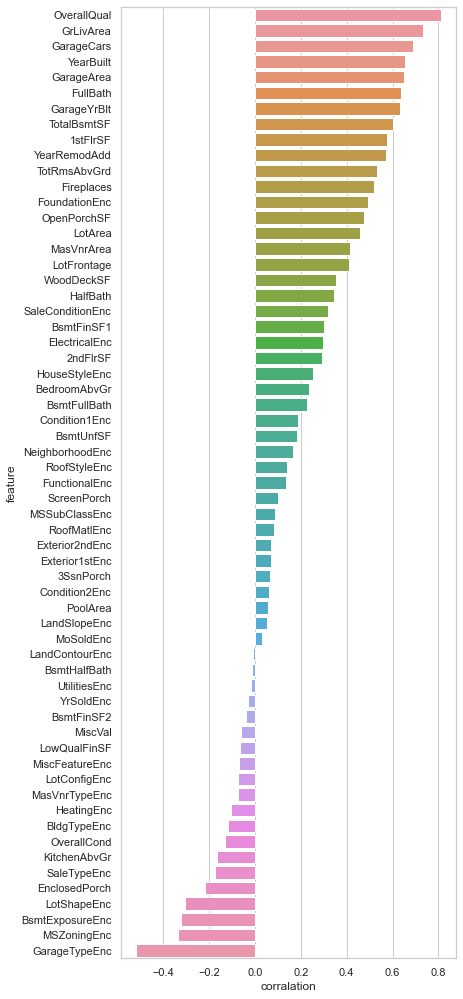

In [89]:
price_corr_df = pd.DataFrame()
price_corr_df['feature'] = corr_features
price_corr_df['corralation'] = [train_df[feature].corr(train_df['SalePrice'], 'spearman') for feature in corr_features]
price_corr_df.sort_values('corralation', ascending=[0], inplace=True)

plt.figure(figsize=(6, 0.25 * len(features)))
sns.barplot(data=price_corr_df, x='corralation', y='feature', orient='h')